In [246]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv(r'C:\Users\Elsaka\AMIT\Assignments\credit_score.csv')
pd.options.display.max_columns=None
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


# check if we have duplicated rows

In [3]:
df.duplicated().sum()

0

In [4]:
df.shape

(100000, 28)

>- ID,customer_id,name,SNN---------> They won't affect on the credit score because it is a unique personal information so we can drop them

In [5]:
df.drop(['ID','Customer_ID','Name' ,'SSN'],axis=1 , inplace=True)

In [6]:
df.columns

Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
       'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

# atternative to info()

In [7]:
def columns_info(df):
    colms = []
    dtypes = []
    unique = []
    nunique = []
    nulls = []
    
    for colm in df.columns:
        colms.append(colm)
        dtypes.append(df[colm].dtypes)
        unique.append(df[colm].unique())
        nunique.append(df[colm].nunique())
        nulls.append(df[colm].isna().sum())
        
    return pd.DataFrame({'Columns':colms ,
                         'Data Types': dtypes,
                         'Unique values':unique,
                         'Number of unique': nunique,
                         'missing values':nulls})  
columns_info(df)

,Columns,Data Types,Unique values,Number of unique,missing values
0,Month,object,"[January, February, March, April, May, June, J...",8,0
1,Age,object,"[23, -500, 28_, 28, 34, 54, 55, 21, 31, 33, 34...",1788,0
2,Occupation,object,"[Scientist, _______, Teacher, Engineer, Entrep...",16,0
3,Annual_Income,object,"[19114.12, 34847.84, 34847.84_, 143162.64, 306...",18940,0
4,Monthly_Inhand_Salary,float64,"[1824.8433333333328, nan, 3037.986666666666, 1...",13235,15002
5,Num_Bank_Accounts,int64,"[3, 2, 1, 7, 4, 0, 8, 5, 6, 9, 10, 1414, 1231,...",943,0
6,Num_Credit_Card,int64,"[4, 1385, 5, 1288, 1, 7, 6, 1029, 488, 8, 1381...",1179,0
7,Interest_Rate,int64,"[3, 6, 8, 4, 5, 5318, 15, 7, 12, 20, 1, 433, 1...",1750,0
8,Num_of_Loan,object,"[4, 1, 3, 967, -100, 0, 0_, 2, 3_, 2_, 7, 5, 5...",434,0
9,Type_of_Loan,object,"[Auto Loan, Credit-Builder Loan, Personal Loan...",6260,11408


#  Outlier Function with (I Q R _ stander deviation) 

In [8]:
def check_outliers(colm,df):
    q1=df[colm].quantile(0.25)
    q3=df[colm].quantile(0.75)
    iqr=q3-q1
    lower_bound=q1-1.5*iqr
    upper_bound=q3+1.5*iqr
    outliers = []
    
    for i in range(len(df)):
        value = df.loc[i,colm]
        if value > upper_bound or value < lower_bound :
            outliers.append(value)
    return outliers

In [9]:
def handle_outliers(colm,df):
    q1=df[colm].quantile(0.25)
    q3=df[colm].quantile(0.75)
    iqr=q3-q1
    lower_bound= q1-1.5*iqr
    upper_bound= q3+1.5*iqr
    
    for i in range (len(df)):
        if df.loc[i,colm] < lower_bound :
            df.loc[i,colm] = lower_bound
        elif  df.loc[i,colm] > upper_bound:
             df.loc[i,colm] = upper_bound 
                
    
    

# 1-Month

In [10]:
df['Month'].unique()

array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August'], dtype=object)

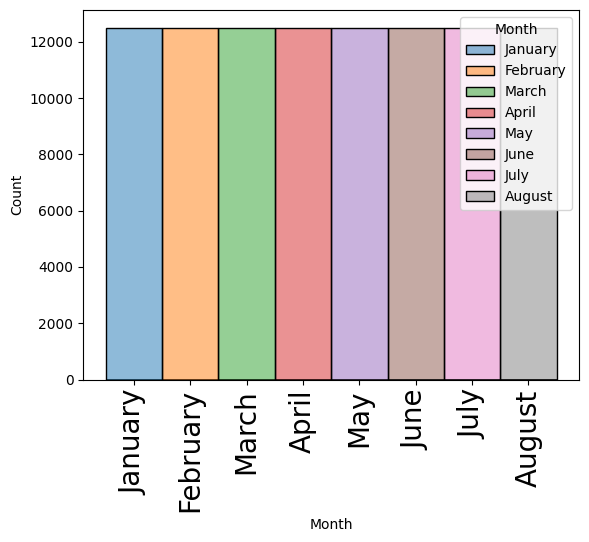

In [11]:
plt.xticks(fontsize=20 ,rotation="vertical" )
sns.histplot(x='Month' , data=df, hue='Month' )
plt.show()

In [12]:
import datetime
df['Month'] = df['Month'].apply(lambda N: datetime.datetime.strptime(N, '%B').month)

In [13]:
df['Month'].unique()

array([1, 2, 3, 4, 5, 6, 7, 8], dtype=int64)

# 2-Age

In [14]:
df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,1,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,11.27,4.0,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,2,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",-1,NaN,11.27,4.0,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,3,-500,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7,_,4.0,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,4,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4,6.27,4.0,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,5,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,NaN,11.27,4.0,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [15]:
df['Age'].unique()

array(['23', '-500', '28_', ..., '4808_', '2263', '1342'], dtype=object)

In [16]:
df['Age']=df['Age'].str.replace('-','')
df['Age']=df['Age'].str.replace('_','')
df['Age']=df['Age'].astype(int)

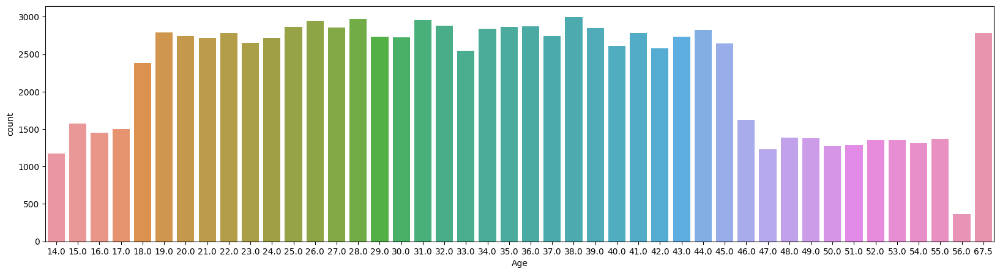

In [247]:
plt.figure(figsize=(20,5))
sns.countplot(x='Age' , data= df)
plt.show()

In [18]:
df['Age'].describe()

count    100000.000000
mean        119.509700
std         684.757313
min          14.000000
25%          25.000000
50%          34.000000
75%          42.000000
max        8698.000000
Name: Age, dtype: float64

In [19]:
check_outliers('Age',df)

[500,
 7580,
 500,
 181,
 995,
 5079,
 6409,
 500,
 7080,
 849,
 500,
 3885,
 3052,
 5342,
 4431,
 500,
 2657,
 2111,
 1032,
 500,
 456,
 5717,
 500,
 500,
 500,
 3169,
 1191,
 500,
 7140,
 500,
 500,
 8233,
 6955,
 500,
 2534,
 3115,
 7657,
 5112,
 500,
 6452,
 2744,
 500,
 1439,
 5795,
 4872,
 500,
 1772,
 1383,
 5657,
 500,
 1934,
 500,
 8352,
 500,
 3734,
 500,
 2056,
 500,
 7508,
 2339,
 8406,
 1424,
 500,
 500,
 500,
 500,
 6953,
 5626,
 4471,
 548,
 500,
 500,
 500,
 500,
 769,
 500,
 500,
 500,
 5490,
 525,
 4202,
 3665,
 7670,
 500,
 4670,
 3616,
 6922,
 6619,
 1808,
 7992,
 223,
 1232,
 4659,
 6895,
 395,
 7099,
 500,
 6048,
 3936,
 500,
 3512,
 123,
 500,
 5639,
 471,
 500,
 7359,
 4049,
 5053,
 2109,
 7183,
 5604,
 1206,
 6835,
 500,
 4067,
 1812,
 1170,
 3625,
 500,
 6354,
 3724,
 480,
 500,
 500,
 500,
 5610,
 4710,
 500,
 4351,
 5784,
 3937,
 3542,
 2239,
 5645,
 500,
 7425,
 7851,
 500,
 2027,
 6306,
 835,
 3513,
 6846,
 6868,
 7805,
 500,
 7274,
 500,
 831,
 8394,
 500

In [20]:
handle_outliers('Age',df)

In [21]:
check_outliers('Age',df)

[]

Text(0.5, 1.0, 'Age distribution')

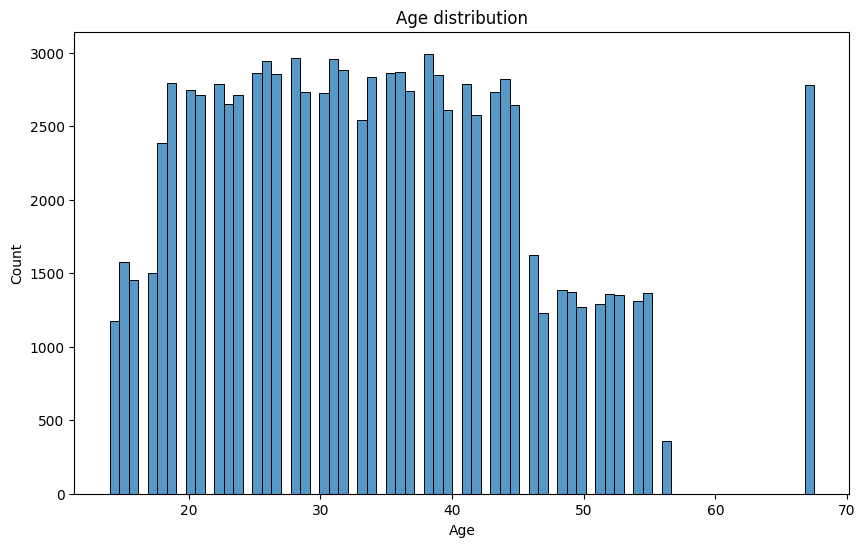

In [22]:
plt.figure(figsize=(10, 6))
sns.histplot(x='Age' , data =df)
plt.title("Age distribution")

>- Most of the clients' age ranges from 20 to 40 years 

# 3- Occupation

In [23]:
df['Occupation'].unique()

array(['Scientist', '_______', 'Teacher', 'Engineer', 'Entrepreneur',
       'Developer', 'Lawyer', 'Media_Manager', 'Doctor', 'Journalist',
       'Manager', 'Accountant', 'Musician', 'Mechanic', 'Writer',
       'Architect'], dtype=object)

In [24]:
df['Occupation']=df['Occupation'].replace('_______','Cyber security engineer')

In [25]:
df['Occupation'].value_counts()

Cyber security engineer    7062
Lawyer                     6575
Architect                  6355
Engineer                   6350
Scientist                  6299
Mechanic                   6291
Accountant                 6271
Developer                  6235
Media_Manager              6232
Teacher                    6215
Entrepreneur               6174
Doctor                     6087
Journalist                 6085
Manager                    5973
Musician                   5911
Writer                     5885
Name: Occupation, dtype: int64

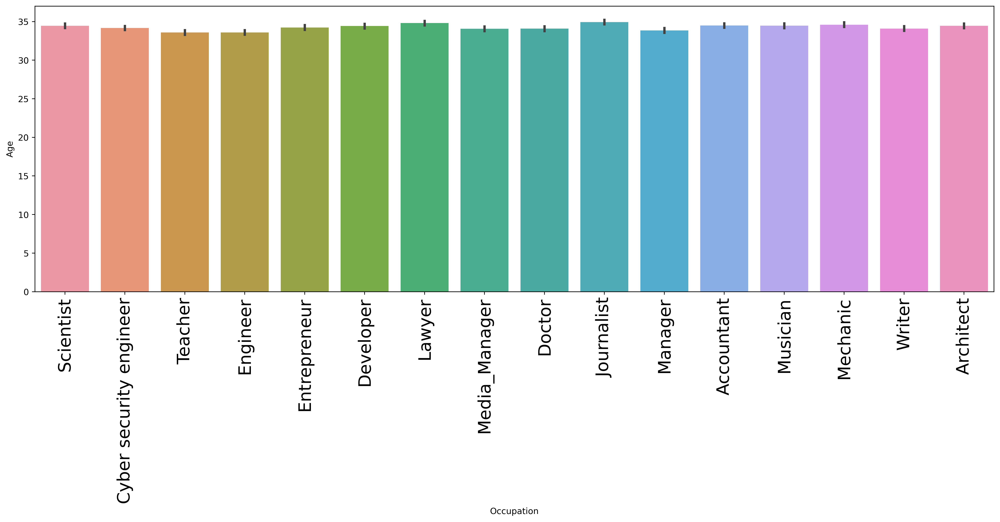

In [26]:
plt.figure(figsize = (20,6), dpi = 400)
plt.xticks(fontsize=20, rotation="vertical")
sns.barplot(x='Occupation',y='Age',data =df)
plt.show()

# 4- Annual_Income

In [27]:
df['Annual_Income'].unique()

array(['19114.12', '34847.84', '34847.84_', ..., '20002.88', '39628.99',
       '39628.99_'], dtype=object)

In [28]:
df['Annual_Income'] = df['Annual_Income'].str.replace('_','')
df['Annual_Income'] = df['Annual_Income'].str.replace('-','')
df['Annual_Income'] = df['Annual_Income'].astype(float)

In [29]:
df['Annual_Income'].unique()

array([ 19114.12,  34847.84, 143162.64, ...,  37188.1 ,  20002.88,
        39628.99])

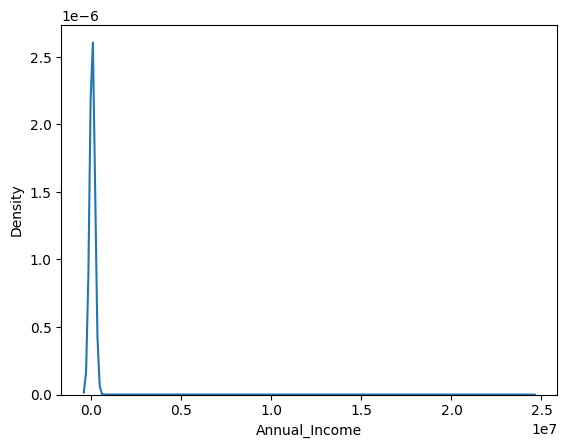

In [30]:
sns.kdeplot(x= 'Annual_Income' , data =df)
plt.show()

In [31]:
check_outliers('Annual_Income',df)

[10909427.0,
 6515990.0,
 586359.0,
 18334118.0,
 19717385.0,
 2709655.0,
 2592822.0,
 19257912.0,
 22335783.0,
 16367214.0,
 8908998.0,
 9351702.0,
 2547968.0,
 15560525.0,
 4282515.0,
 16174808.0,
 21246612.0,
 173196.32,
 173196.32,
 173196.32,
 173196.32,
 173196.32,
 173196.32,
 173196.32,
 173196.32,
 14089102.0,
 873048.0,
 12311582.0,
 22409880.0,
 177150.4,
 177150.4,
 177150.4,
 177150.4,
 177150.4,
 177150.4,
 177150.4,
 177150.4,
 5444147.0,
 162550.32,
 162550.32,
 162550.32,
 162550.32,
 162550.32,
 162550.32,
 162550.32,
 162550.32,
 9374962.0,
 11993705.0,
 174304.04,
 174304.04,
 174304.04,
 174304.04,
 174304.04,
 174304.04,
 174304.04,
 174304.04,
 13019734.0,
 16729446.0,
 7170493.0,
 3961526.0,
 23181767.0,
 174179.64,
 174179.64,
 174179.64,
 174179.64,
 174179.64,
 174179.64,
 174179.64,
 174179.64,
 21723268.0,
 177243.92,
 177243.92,
 177243.92,
 177243.92,
 177243.92,
 177243.92,
 177243.92,
 177243.92,
 14416399.0,
 3950629.0,
 22579073.0,
 20441835.0,
 18737

In [32]:
handle_outliers('Annual_Income',df)

In [33]:
check_outliers('Annual_Income',df)

[]

<AxesSubplot: xlabel='Annual_Income', ylabel='Density'>

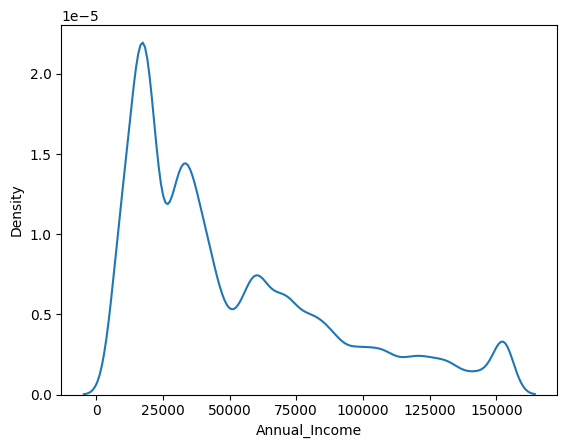

In [34]:
sns.kdeplot(x= 'Annual_Income' , data =df)

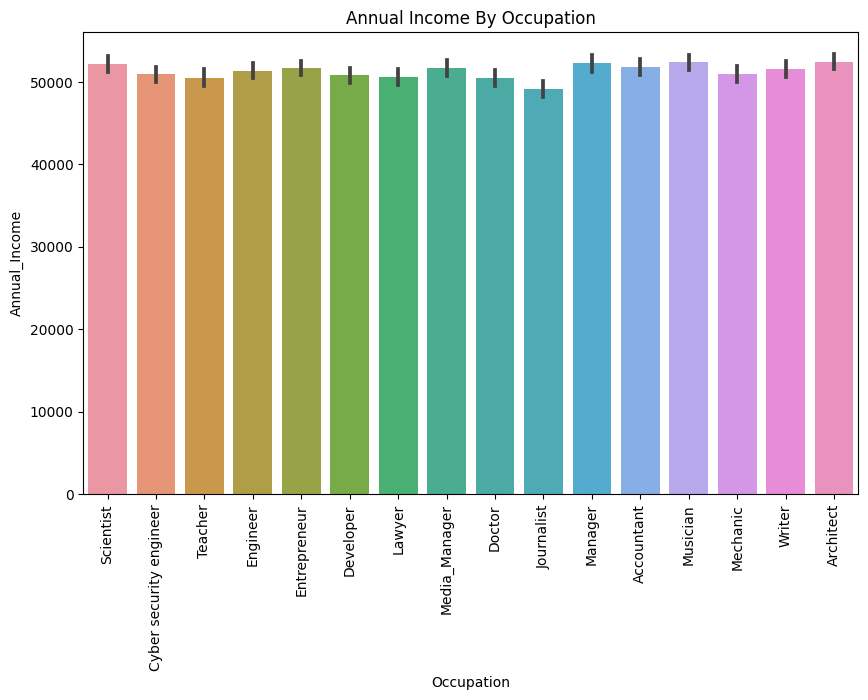

In [35]:
plt.figure(figsize=(10, 6))
plt.xticks(fontsize=10, rotation="vertical")
sns.barplot(y=df['Annual_Income'], x=df["Occupation"])
plt.title("Annual Income By Occupation")
plt.show()

# 5- Monthly_Inhand_Salary

In [36]:
df['Monthly_Inhand_Salary'].unique()

array([1824.84333333,           nan, 3037.98666667, ..., 3097.00833333,
       1929.90666667, 3359.41583333])

In [37]:
mean=df['Monthly_Inhand_Salary'].mean()
df['Monthly_Inhand_Salary'].fillna(mean,inplace=True)

In [38]:
df['Monthly_Inhand_Salary'].isnull().sum()

0

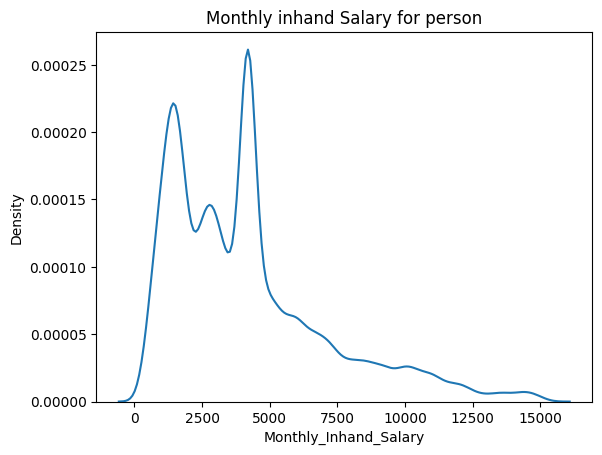

In [39]:
sns.kdeplot(x=df['Monthly_Inhand_Salary'] , data =df)
plt.title('Monthly inhand Salary for person')   
plt.show()

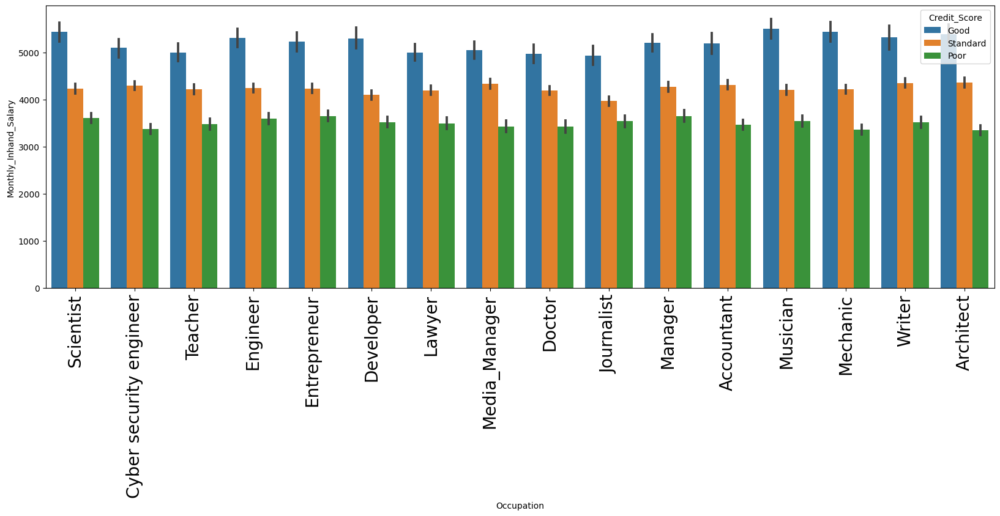

In [40]:
plt.figure(figsize=(20,6))
plt.xticks(fontsize=20 , rotation= 'vertical')
sns.barplot(y=df['Monthly_Inhand_Salary'] , x= df['Occupation'], data=df , hue='Credit_Score')
plt.show()

In [41]:
check_outliers('Monthly_Inhand_Salary',df)

[12187.22,
 12187.22,
 12187.22,
 12187.22,
 12187.22,
 12187.22,
 12187.22,
 11242.783333333333,
 11242.783333333333,
 12432.61,
 12432.61,
 12432.61,
 12432.61,
 12432.61,
 12432.61,
 12432.61,
 12432.61,
 11809.56,
 11809.56,
 11809.56,
 11809.56,
 11809.56,
 10795.6325,
 10795.6325,
 10795.6325,
 10795.6325,
 10795.6325,
 10795.6325,
 11059.186666666665,
 11059.186666666665,
 10872.26505763546,
 10872.26505763546,
 10872.26505763546,
 10872.26505763546,
 10872.26505763546,
 10872.26505763546,
 10872.26505763546,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11877.473333333332,
 11064.453333333331,
 11064.453333333331,
 11064.453333333331,
 12353.633333333331,
 12353.633333333331,
 12353.633333333331,
 12353.633333333331,
 12353.633333333331,
 12353.633333333331,
 11203.726666666667,
 11203.726666666667,
 11203.726666666667,
 11203.726666666667,
 11203.726666666667,
 11203.726666666

In [42]:
handle_outliers('Monthly_Inhand_Salary',df)

In [43]:
check_outliers('Monthly_Inhand_Salary',df)

[]

<AxesSubplot: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

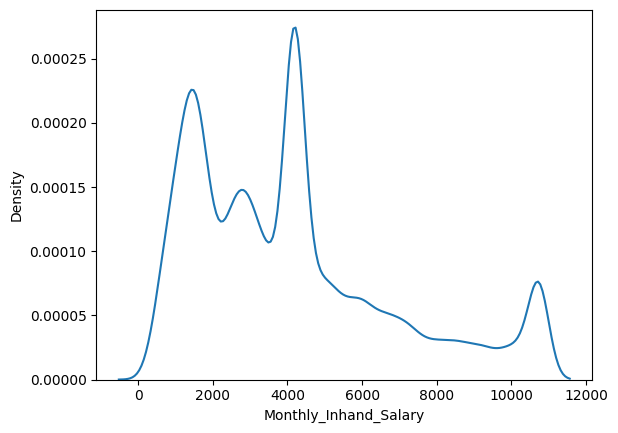

In [44]:
sns.kdeplot(x=df['Monthly_Inhand_Salary'] , data =df)

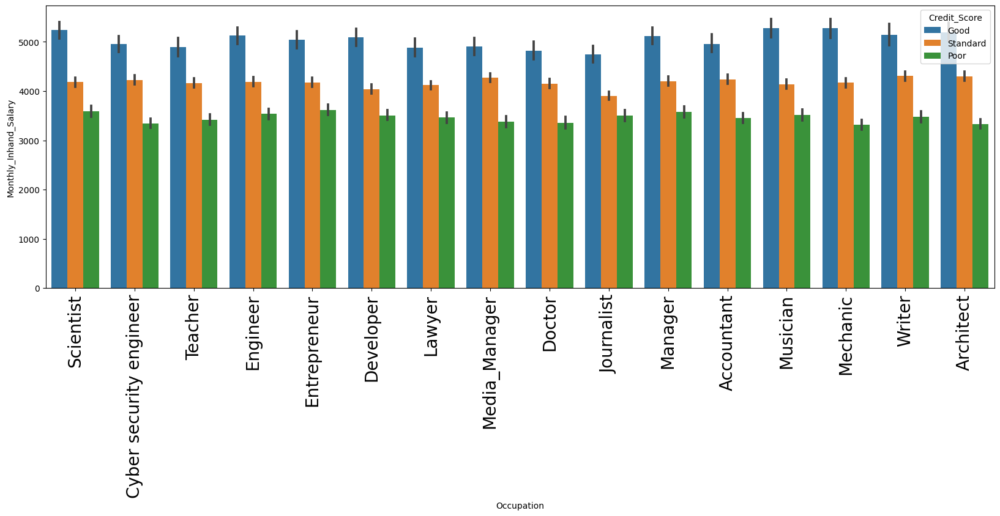

In [45]:
plt.figure(figsize=(20,6))
plt.xticks(fontsize=20 , rotation= 'vertical')
sns.barplot(y=df['Monthly_Inhand_Salary'] , x= df['Occupation'], data=df , hue='Credit_Score')
plt.show()

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  int64  
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  object 
 9   Type_of_Loan              88592 non-null   object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   object 
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

# 6-  Num_Bank_Accounts

In [47]:
df['Num_Bank_Accounts'].unique()

array([   3,    2,    1,    7,    4,    0,    8,    5,    6,    9,   10,
       1414, 1231,   67,  572, 1488,   91,  528, 1647, 1696, 1338,  649,
        889, 1668,  685,  857,  975, 1496, 1534, 1620,   37, 1388, 1429,
       1332, 1588,  120, 1777, 1096,  803,  494,  744, 1139,  831, 1613,
        741,  121,  665, 1748, 1644,  823, 1356, 1651,   87,  711,  450,
        210, 1671, 1722,  648,  672, 1662, 1495,  510,  666,  429, 1131,
       1434,  980, 1026,  526,  718, 1300, 1312, 1315,  501, 1566,  480,
       1042,  322,  628, 1016,  333, 1265,  791,  427,  563,  905, 1190,
       1036, 1611,   38,  619,  555, 1769,  280,  752, 1201,  812, 1487,
        222,  212, 1019, 1222,  610, 1714, 1308,  525, 1158, 1115, 1616,
        754, 1601,  797, 1577,  521,  703,  933,  959,  809, 1089, 1656,
       1113, 1715,  964, 1533, 1789,  871,  434, 1295,  565, 1724,  603,
        677,  541,  698, 1101,  464, 1539, 1462, 1011, 1257, 1727,   45,
        244, 1266,  897,  535,  484,  331,  675,  8

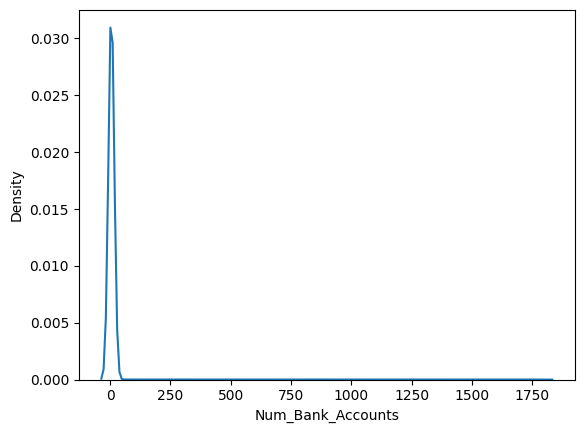

In [48]:
sns.kdeplot(x= df['Num_Bank_Accounts'] , data= df)
plt.show()

In [49]:
df['Num_Bank_Accounts'].describe()

count    100000.000000
mean         17.091280
std         117.404834
min          -1.000000
25%           3.000000
50%           6.000000
75%           7.000000
max        1798.000000
Name: Num_Bank_Accounts, dtype: float64

>- have a negative values 

In [50]:
df['Num_Bank_Accounts'][df['Num_Bank_Accounts'] < 0] = 0

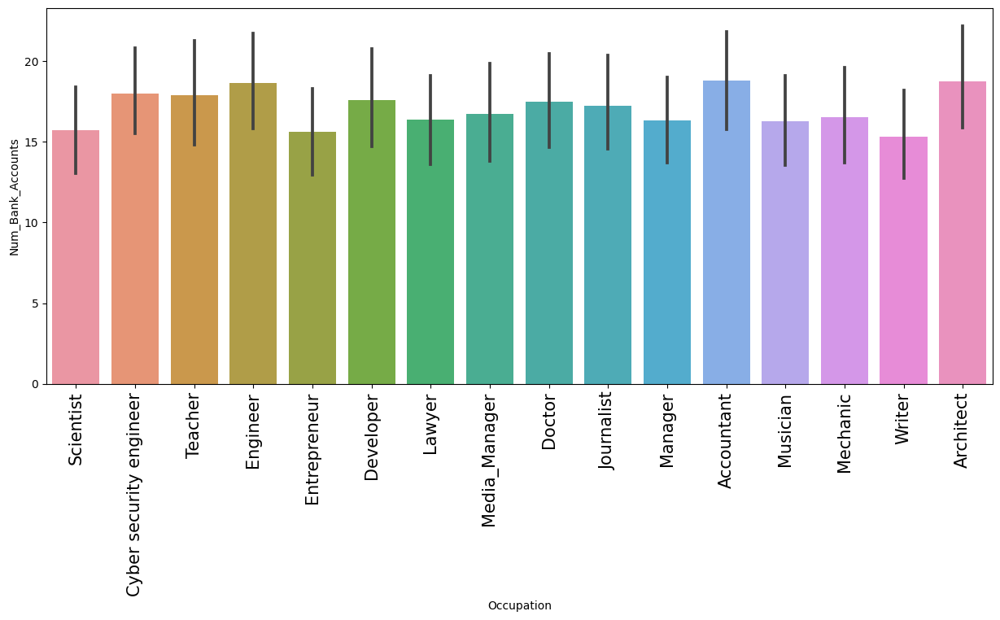

In [51]:
plt.figure(figsize=(15,6))
plt.xticks(fontsize=15 , rotation= 'vertical')
sns.barplot(x= df['Occupation'] , y= df['Num_Bank_Accounts']  , data = df)
plt.show()

In [52]:
check_outliers('Num_Bank_Accounts', df)

[1414,
 1231,
 67,
 572,
 1488,
 91,
 528,
 1647,
 1696,
 1338,
 649,
 889,
 1668,
 685,
 857,
 975,
 1496,
 1534,
 1620,
 37,
 1388,
 1429,
 1332,
 1588,
 120,
 1777,
 1096,
 803,
 494,
 744,
 1139,
 1414,
 831,
 1613,
 741,
 121,
 665,
 1748,
 1644,
 823,
 1356,
 1651,
 87,
 711,
 450,
 210,
 1671,
 1722,
 648,
 672,
 1662,
 1495,
 510,
 666,
 429,
 1131,
 1434,
 980,
 1026,
 526,
 718,
 1300,
 1312,
 1315,
 501,
 1566,
 480,
 1042,
 322,
 628,
 1016,
 333,
 1265,
 791,
 427,
 563,
 905,
 1190,
 1036,
 1611,
 38,
 619,
 555,
 1769,
 280,
 752,
 1201,
 812,
 1487,
 222,
 212,
 1019,
 1222,
 610,
 1714,
 1308,
 525,
 1158,
 1115,
 1616,
 754,
 494,
 1601,
 797,
 1577,
 521,
 703,
 933,
 959,
 809,
 1089,
 1668,
 1656,
 1113,
 1715,
 964,
 1533,
 1789,
 871,
 434,
 1295,
 565,
 1724,
 603,
 677,
 120,
 541,
 698,
 1101,
 464,
 1539,
 1462,
 1011,
 1257,
 1727,
 45,
 244,
 1266,
 897,
 535,
 484,
 331,
 675,
 1332,
 826,
 946,
 1675,
 105,
 1327,
 845,
 1026,
 549,
 473,
 710,
 210,
 527

In [53]:
handle_outliers('Num_Bank_Accounts' ,df)

In [54]:
check_outliers('Num_Bank_Accounts',df)

[]

In [55]:
df['Num_Bank_Accounts'].describe()

count    100000.000000
mean          5.468200
std           2.719004
min           0.000000
25%           3.000000
50%           6.000000
75%           7.000000
max          13.000000
Name: Num_Bank_Accounts, dtype: float64

<AxesSubplot: xlabel='Num_Bank_Accounts', ylabel='Density'>

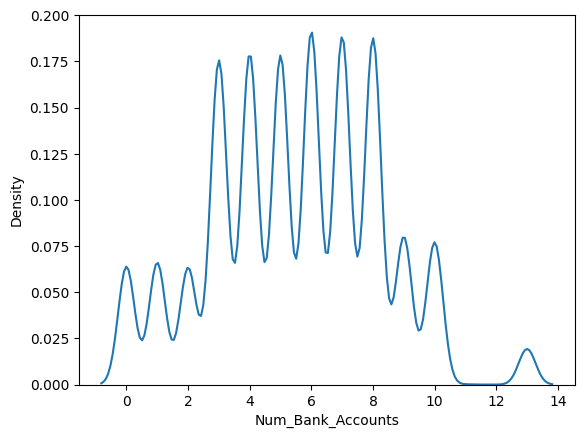

In [56]:
sns.kdeplot(x = df['Num_Bank_Accounts'] , data=df)

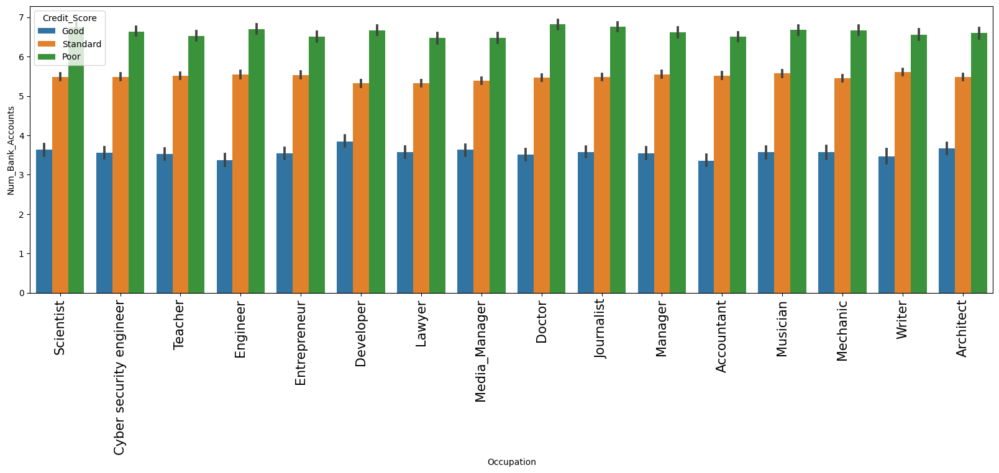

In [57]:
plt.figure(figsize=(20,6))
plt.xticks(fontsize=15 , rotation= 'vertical')
sns.barplot(x= df['Occupation'] , y= df['Num_Bank_Accounts']  , data = df , hue='Credit_Score')
plt.show()

# 7- Interest_Rate

In [58]:
df['Interest_Rate'].unique()

array([   3,    6,    8, ..., 1347,  387, 5729], dtype=int64)

In [59]:
df['Interest_Rate'].isna().sum()

0

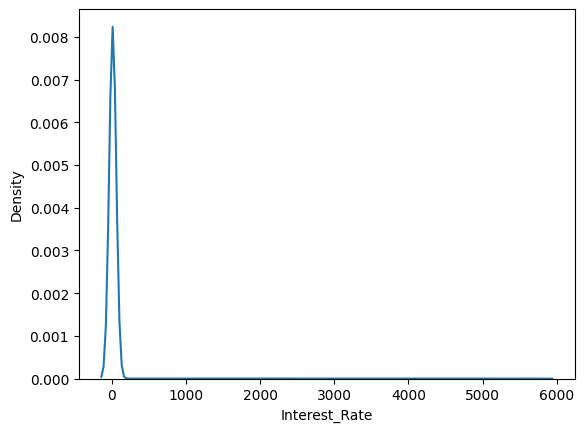

In [60]:
sns.kdeplot(x= df['Interest_Rate'] , data = df)
plt.show()

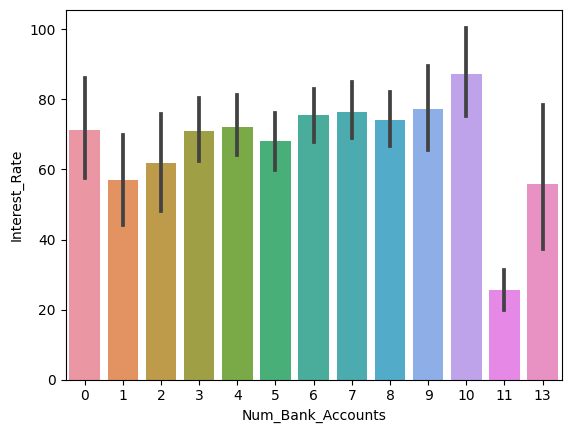

In [61]:
sns.barplot( x= df['Num_Bank_Accounts'] , y = df['Interest_Rate'] , data = df)
plt.show()

In [62]:
check_outliers('Interest_Rate', df)

[5318,
 433,
 5240,
 4975,
 668,
 753,
 748,
 1138,
 5261,
 3238,
 2607,
 2724,
 1224,
 570,
 207,
 3366,
 5565,
 713,
 3951,
 5189,
 872,
 2199,
 2862,
 3863,
 3579,
 1649,
 4353,
 3010,
 2127,
 3959,
 3325,
 2398,
 4595,
 2800,
 964,
 2867,
 2660,
 707,
 5389,
 525,
 1228,
 1115,
 2621,
 2866,
 1352,
 5199,
 3801,
 5721,
 3487,
 3755,
 2882,
 4614,
 2550,
 5627,
 215,
 438,
 2565,
 2091,
 4892,
 5645,
 2620,
 5639,
 3826,
 4831,
 2232,
 2200,
 3067,
 73,
 2197,
 2701,
 3614,
 533,
 1684,
 1473,
 3050,
 3769,
 2057,
 2310,
 1215,
 1032,
 910,
 4452,
 2729,
 1142,
 1708,
 4263,
 4480,
 4350,
 4363,
 128,
 3902,
 3352,
 2771,
 213,
 2865,
 4195,
 5069,
 3200,
 2304,
 820,
 1909,
 348,
 5397,
 1319,
 232,
 1033,
 4220,
 1646,
 3800,
 4757,
 76,
 3314,
 1944,
 4232,
 3808,
 3881,
 4153,
 4793,
 316,
 2764,
 1908,
 115,
 1886,
 949,
 3813,
 3319,
 2894,
 849,
 2779,
 369,
 284,
 4464,
 3709,
 4541,
 1972,
 5061,
 2431,
 3641,
 4033,
 1634,
 1592,
 330,
 5446,
 938,
 3868,
 4316,
 989,
 206

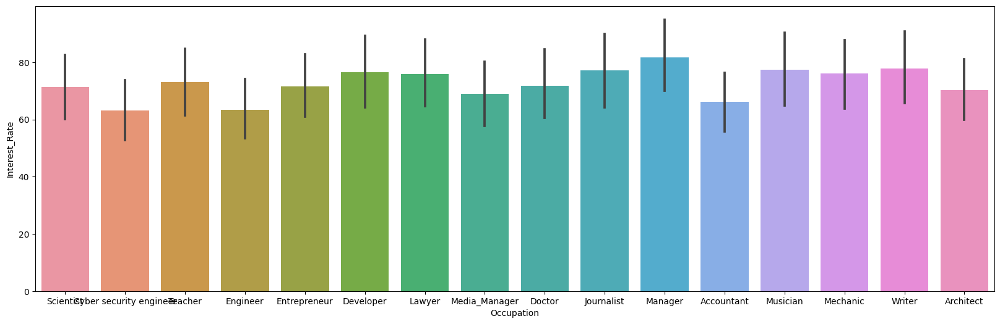

In [63]:
plt.figure(figsize = (20,6))
sns.barplot(x='Occupation',y='Interest_Rate',data =df)
plt.show()

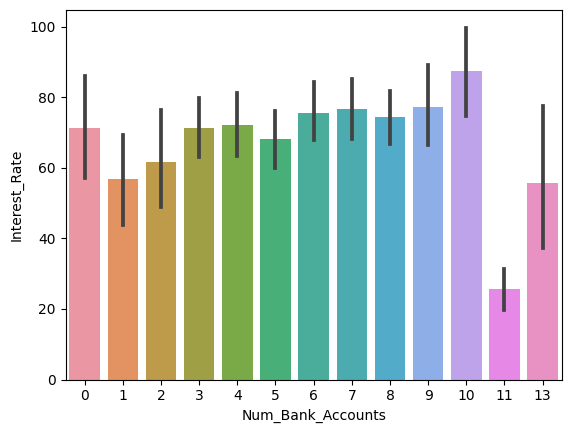

In [64]:
sns.barplot( x= df['Num_Bank_Accounts'] , y = df['Interest_Rate'] , data = df)
plt.show()

# 8- Num_Credit_Card

In [65]:
df['Num_Credit_Card'].unique()

array([   4, 1385,    5, ...,  955, 1430,  679], dtype=int64)

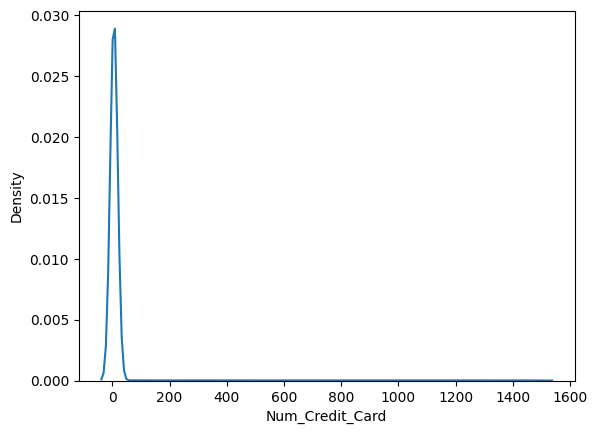

In [66]:
sns.kdeplot(x=df['Num_Credit_Card'] , data =df)
plt.show()

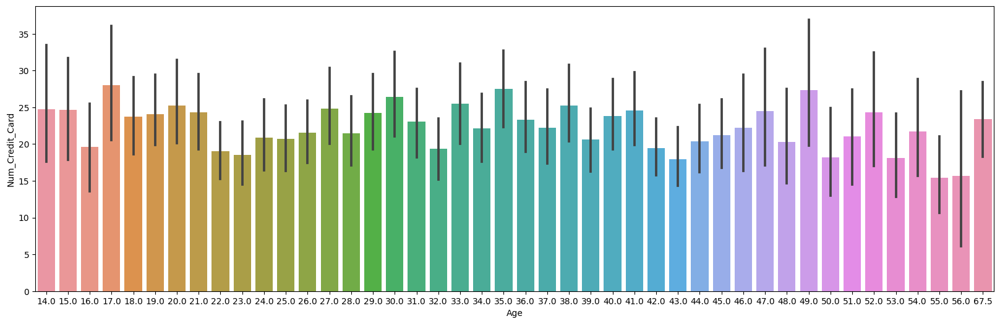

In [67]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Age'], y=df['Num_Credit_Card'] ,data =df)
plt.show()

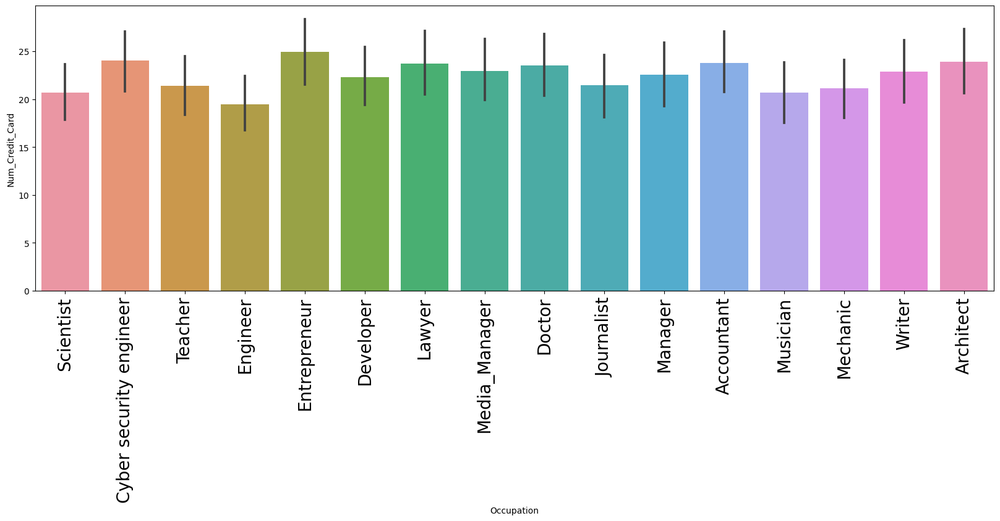

In [68]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Occupation'], y=df['Num_Credit_Card'] ,data =df)
plt.xticks(fontsize=20 ,rotation="vertical")
plt.show()

In [69]:
df['Num_Credit_Card'].describe()

count    100000.00000
mean         22.47443
std         129.05741
min           0.00000
25%           4.00000
50%           5.00000
75%           7.00000
max        1499.00000
Name: Num_Credit_Card, dtype: float64

In [70]:
check_outliers('Num_Credit_Card', df)

[1385,
 1288,
 1029,
 488,
 1381,
 898,
 518,
 1005,
 1327,
 1189,
 514,
 943,
 262,
 809,
 932,
 1247,
 688,
 848,
 1163,
 674,
 1315,
 1130,
 451,
 1486,
 1201,
 169,
 1423,
 1297,
 1299,
 183,
 538,
 1191,
 1292,
 1112,
 496,
 803,
 102,
 249,
 986,
 1426,
 211,
 1432,
 1477,
 615,
 184,
 1192,
 97,
 264,
 137,
 1387,
 1307,
 447,
 158,
 1141,
 780,
 1052,
 900,
 331,
 996,
 912,
 1071,
 879,
 419,
 1415,
 1038,
 132,
 39,
 170,
 403,
 622,
 1428,
 142,
 306,
 610,
 489,
 1223,
 637,
 1354,
 1434,
 1358,
 705,
 249,
 540,
 732,
 1208,
 1389,
 1480,
 1325,
 353,
 223,
 1084,
 1439,
 547,
 1375,
 980,
 392,
 569,
 1217,
 412,
 1323,
 1379,
 1174,
 380,
 889,
 297,
 1071,
 924,
 773,
 1178,
 1080,
 1168,
 363,
 758,
 1323,
 397,
 1436,
 472,
 183,
 1116,
 842,
 75,
 325,
 268,
 1326,
 731,
 1278,
 117,
 1192,
 1038,
 274,
 292,
 883,
 1072,
 997,
 953,
 716,
 86,
 1163,
 507,
 1456,
 648,
 736,
 634,
 309,
 1331,
 1165,
 1435,
 626,
 1223,
 1414,
 1056,
 372,
 151,
 890,
 490,
 909,
 1

In [71]:
handle_outliers('Num_Credit_Card',df)

In [72]:
check_outliers('Num_Credit_Card', df)

[]

<AxesSubplot: xlabel='Num_Credit_Card', ylabel='Density'>

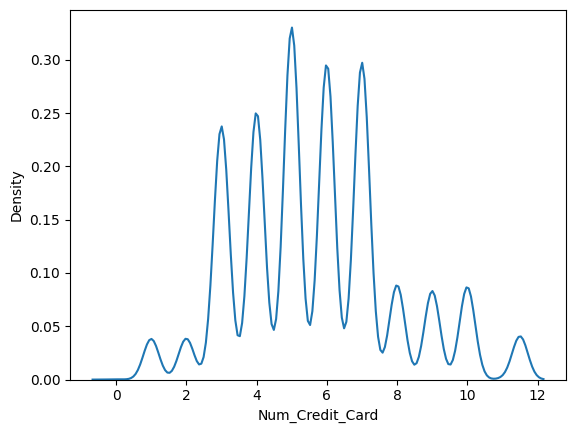

In [73]:
sns.kdeplot(x= 'Num_Credit_Card', data =df)

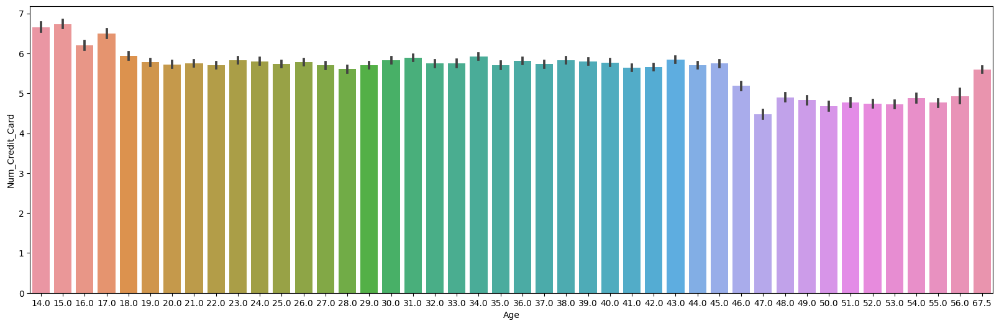

In [74]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Age'], y=df['Num_Credit_Card'] ,data =df )
plt.show()

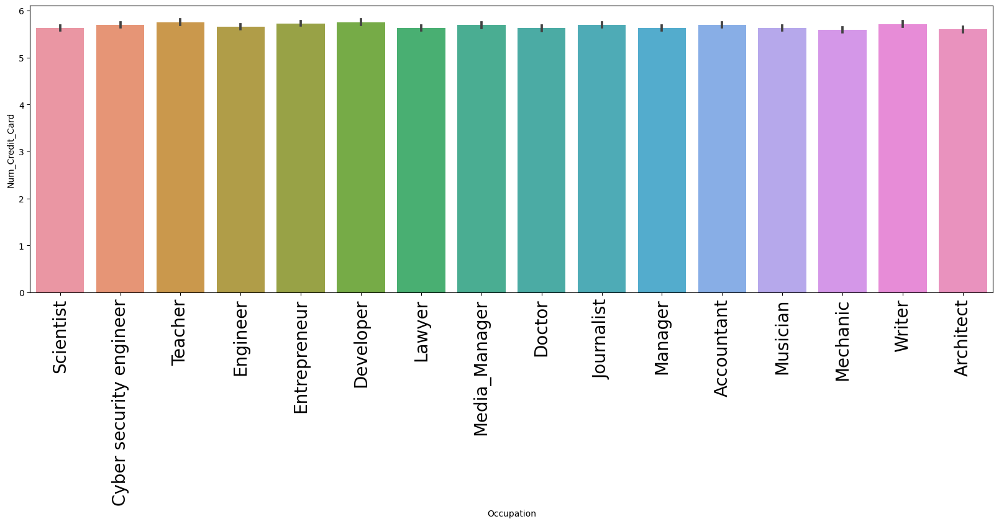

In [75]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Occupation'], y=df['Num_Credit_Card'] ,data =df)
plt.xticks(fontsize=20 ,rotation="vertical")
plt.show()

# 9- Interest_Rate

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  object 
 9   Type_of_Loan              88592 non-null   object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   object 
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

In [77]:
df['Interest_Rate'].unique()

array([   3,    6,    8, ..., 1347,  387, 5729], dtype=int64)

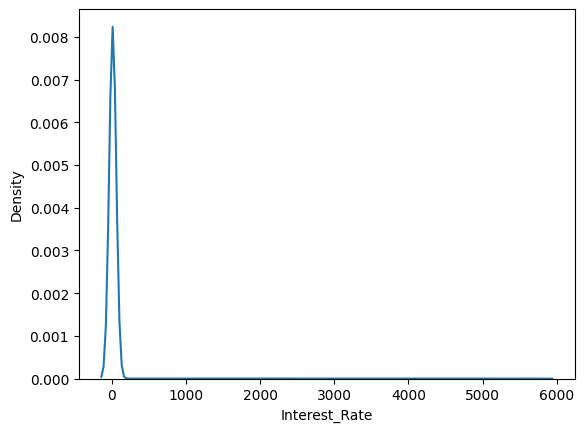

In [78]:
sns.kdeplot(x= df['Interest_Rate'] , data =df)
plt.show()

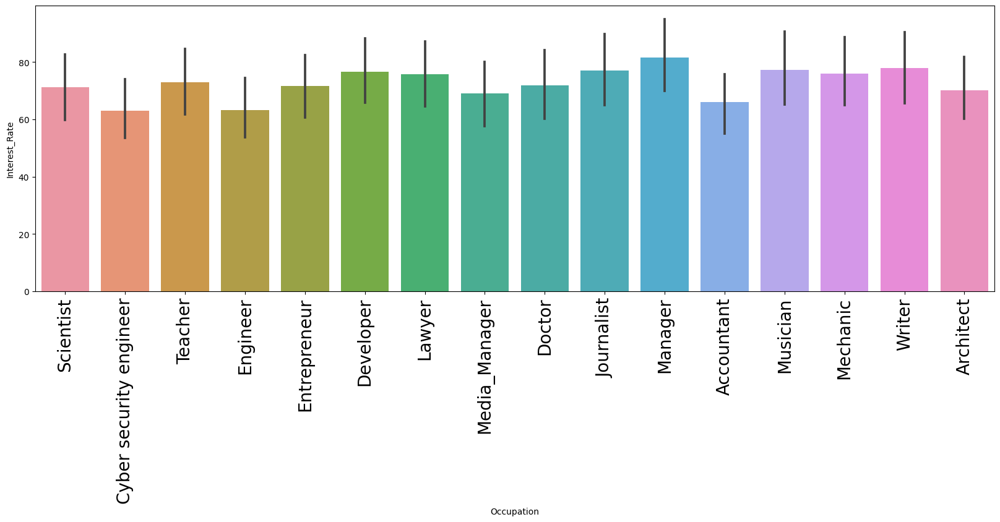

In [79]:
plt.figure(figsize=(20,6))
sns.barplot(x= df['Occupation'],y= df['Interest_Rate'] , data =df)
plt.xticks(fontsize =20 ,rotation="vertical")
plt.show()

In [80]:
check_outliers('Interest_Rate',df)

[5318,
 433,
 5240,
 4975,
 668,
 753,
 748,
 1138,
 5261,
 3238,
 2607,
 2724,
 1224,
 570,
 207,
 3366,
 5565,
 713,
 3951,
 5189,
 872,
 2199,
 2862,
 3863,
 3579,
 1649,
 4353,
 3010,
 2127,
 3959,
 3325,
 2398,
 4595,
 2800,
 964,
 2867,
 2660,
 707,
 5389,
 525,
 1228,
 1115,
 2621,
 2866,
 1352,
 5199,
 3801,
 5721,
 3487,
 3755,
 2882,
 4614,
 2550,
 5627,
 215,
 438,
 2565,
 2091,
 4892,
 5645,
 2620,
 5639,
 3826,
 4831,
 2232,
 2200,
 3067,
 73,
 2197,
 2701,
 3614,
 533,
 1684,
 1473,
 3050,
 3769,
 2057,
 2310,
 1215,
 1032,
 910,
 4452,
 2729,
 1142,
 1708,
 4263,
 4480,
 4350,
 4363,
 128,
 3902,
 3352,
 2771,
 213,
 2865,
 4195,
 5069,
 3200,
 2304,
 820,
 1909,
 348,
 5397,
 1319,
 232,
 1033,
 4220,
 1646,
 3800,
 4757,
 76,
 3314,
 1944,
 4232,
 3808,
 3881,
 4153,
 4793,
 316,
 2764,
 1908,
 115,
 1886,
 949,
 3813,
 3319,
 2894,
 849,
 2779,
 369,
 284,
 4464,
 3709,
 4541,
 1972,
 5061,
 2431,
 3641,
 4033,
 1634,
 1592,
 330,
 5446,
 938,
 3868,
 4316,
 989,
 206

In [81]:
handle_outliers('Interest_Rate',df)

In [82]:
check_outliers('Interest_Rate',df)

[]

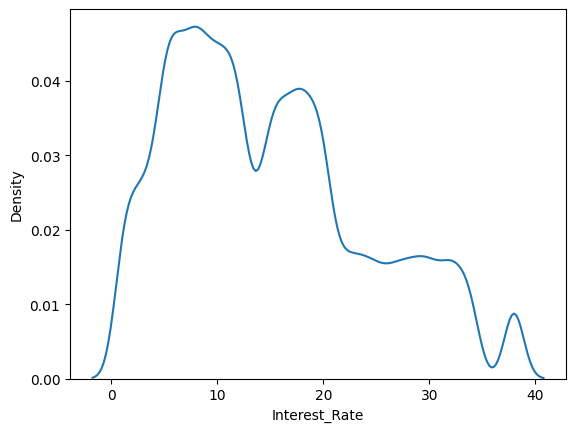

In [83]:
sns.kdeplot(x= df['Interest_Rate'] , data =df)
plt.show()

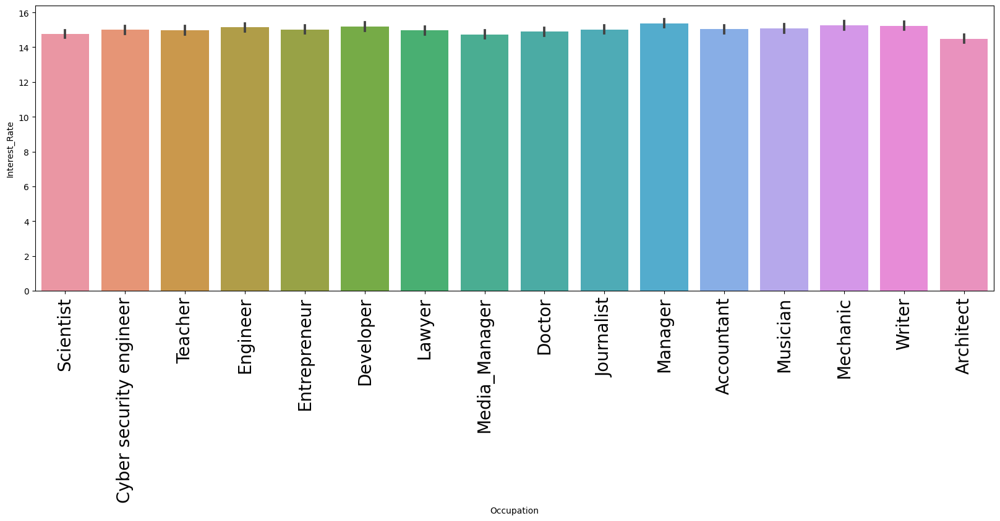

In [84]:
plt.figure(figsize=(20,6))
sns.barplot(x= df['Occupation'],y= df['Interest_Rate'] , data =df)
plt.xticks(fontsize =20 ,rotation="vertical")
plt.show()

# 10- Num_of_Loan

In [85]:
df['Num_of_Loan'].unique()

array(['4', '1', '3', '967', '-100', '0', '0_', '2', '3_', '2_', '7', '5',
       '5_', '6', '8', '8_', '9', '9_', '4_', '7_', '1_', '1464', '6_',
       '622', '352', '472', '1017', '945', '146', '563', '341', '444',
       '720', '1485', '49', '737', '1106', '466', '728', '313', '843',
       '597_', '617', '119', '663', '640', '92_', '1019', '501', '1302',
       '39', '716', '848', '931', '1214', '186', '424', '1001', '1110',
       '1152', '457', '1433', '1187', '52', '1480', '1047', '1035',
       '1347_', '33', '193', '699', '329', '1451', '484', '132', '649',
       '995', '545', '684', '1135', '1094', '1204', '654', '58', '348',
       '614', '1363', '323', '1406', '1348', '430', '153', '1461', '905',
       '1312', '1424', '1154', '95', '1353', '1228', '819', '1006', '795',
       '359', '1209', '590', '696', '1185_', '1465', '911', '1181', '70',
       '816', '1369', '143', '1416', '455', '55', '1096', '1474', '420',
       '1131', '904', '89', '1259', '527', '1241', '449', 

In [86]:
df['Num_of_Loan']=df['Num_of_Loan'].str.replace('_','')
df['Num_of_Loan'] = df['Num_of_Loan'].str.replace('-','')
df['Num_of_Loan']=df['Num_of_Loan'].astype(int)

In [87]:
df['Num_of_Loan'].unique()

array([   4,    1,    3,  967,  100,    0,    2,    7,    5,    6,    8,
          9, 1464,  622,  352,  472, 1017,  945,  146,  563,  341,  444,
        720, 1485,   49,  737, 1106,  466,  728,  313,  843,  597,  617,
        119,  663,  640,   92, 1019,  501, 1302,   39,  716,  848,  931,
       1214,  186,  424, 1001, 1110, 1152,  457, 1433, 1187,   52, 1480,
       1047, 1035, 1347,   33,  193,  699,  329, 1451,  484,  132,  649,
        995,  545,  684, 1135, 1094, 1204,  654,   58,  348,  614, 1363,
        323, 1406, 1348,  430,  153, 1461,  905, 1312, 1424, 1154,   95,
       1353, 1228,  819, 1006,  795,  359, 1209,  590,  696, 1185, 1465,
        911, 1181,   70,  816, 1369,  143, 1416,  455,   55, 1096, 1474,
        420, 1131,  904,   89, 1259,  527, 1241,  449,  983,  418,  319,
         23,  238,  638,  138,  235,  280, 1070, 1484,  274,  494, 1459,
        404, 1354, 1495, 1391,  601, 1313, 1319,  898,  231,  752,  174,
        961, 1046,  834,  284,  438,  288, 1463, 11

In [88]:
df['Num_of_Loan'].describe()

count    100000.000000
mean         10.761960
std          61.789933
min           0.000000
25%           2.000000
50%           3.000000
75%           6.000000
max        1496.000000
Name: Num_of_Loan, dtype: float64

In [89]:
check_outliers('Num_of_Loan', df)

[967,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 1464,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 622,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 352,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 472,
 100,
 1017,
 945,
 100,
 146,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 563,
 341,
 100,
 100,
 444,
 100,
 100,
 100,
 100,
 100,
 720,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 1485,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 49,
 737,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 100,
 1106,
 100,
 100,
 466,
 100,
 100,
 728,
 100,
 100,
 100,
 100,
 100,
 100,
 313,
 100,
 100,
 100,
 100,
 843,
 100,
 100,
 

In [90]:
handle_outliers('Num_of_Loan',df)

In [91]:
check_outliers('Num_of_Loan', df)

[]

<AxesSubplot: xlabel='Num_of_Loan', ylabel='Density'>

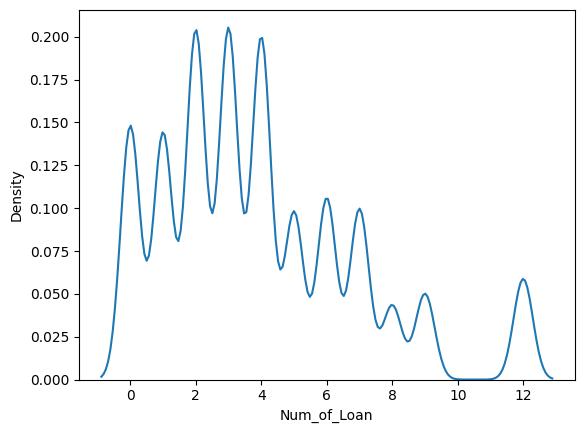

In [92]:
sns.kdeplot(x=df['Num_of_Loan'] , data =df)

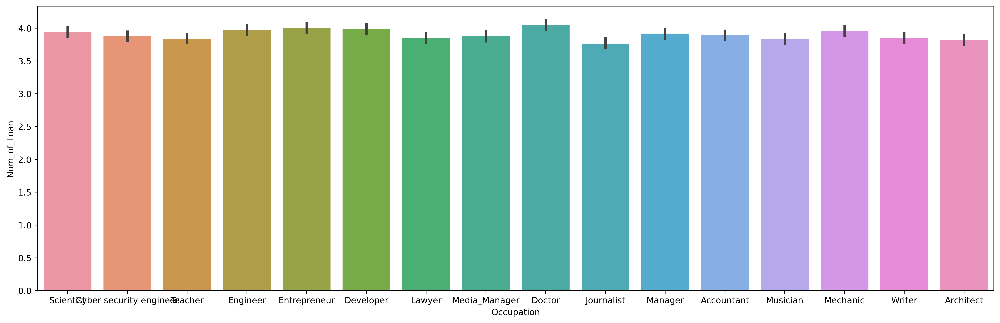

In [93]:
plt.figure(figsize = (20,6), dpi = 400)
sns.barplot(x='Occupation',y='Num_of_Loan',data = df)
plt.show()

# 11- Type_of_Loan

In [94]:
df['Type_of_Loan'].unique()

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
       ..., 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan',
       'Payday Loan, Student Loan, Mortgage Loan, and Not Specified',
       'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan'],
      dtype=object)

In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  int32  
 9   Type_of_Loan              88592 non-null   object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   object 
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

In [96]:
# mean=df['Type_of_Loan'].mean()
# df['Type_of_Loan'].fillna(mean,inplace =True)
df['Type_of_Loan'].fillna('', inplace =True)

In [97]:
df['Type_of_Loan'].isna().sum()

0

# 12- Delay_from_due_date

In [98]:
df['Delay_from_due_date'].unique()

array([ 3, -1,  5,  6,  8,  7, 13, 10,  0,  4,  9,  1, 12, 11, 30, 31, 34,
       27, 14,  2, -2, 16, 17, 15, 23, 22, 21, 18, 19, 52, 51, 48, 53, 26,
       43, 28, 25, 20, 47, 46, 49, 24, 61, 29, 50, 58, 45, 59, 55, 56, 57,
       54, 62, 65, 64, 67, 36, 41, 33, 32, 39, 44, 42, 60, 35, 38, -3, 63,
       40, 37, -5, -4, 66], dtype=int64)

>- Negative numbers must equal zero

In [99]:
df['Delay_from_due_date'][df['Delay_from_due_date'] < 0] = 0

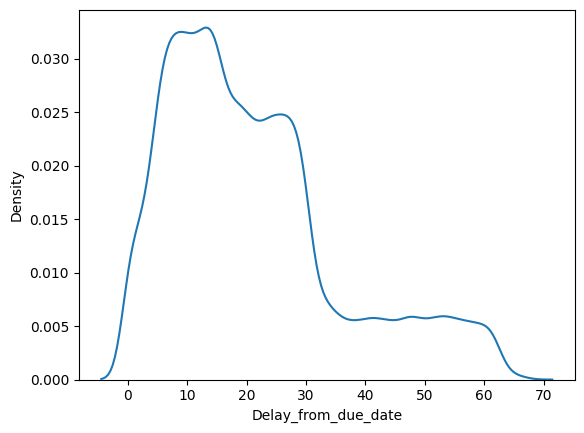

In [100]:
sns.kdeplot(x = df['Delay_from_due_date'] , data =df)
plt.show()

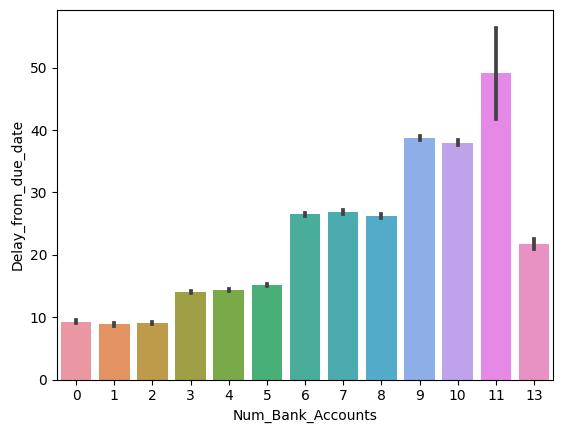

In [101]:
sns.barplot(x=df['Num_Bank_Accounts'] , y =df['Delay_from_due_date'] , data =df)
plt.show()

In [102]:
check_outliers('Delay_from_due_date',df)

[61,
 61,
 61,
 61,
 61,
 61,
 61,
 61,
 58,
 59,
 56,
 59,
 59,
 59,
 61,
 57,
 59,
 57,
 57,
 57,
 57,
 62,
 62,
 65,
 62,
 62,
 62,
 64,
 62,
 62,
 62,
 62,
 62,
 62,
 67,
 59,
 62,
 57,
 57,
 59,
 57,
 57,
 57,
 62,
 61,
 65,
 61,
 61,
 61,
 61,
 61,
 61,
 60,
 60,
 64,
 60,
 60,
 60,
 60,
 60,
 57,
 57,
 57,
 57,
 57,
 57,
 57,
 57,
 61,
 58,
 61,
 61,
 56,
 65,
 65,
 61,
 56,
 60,
 63,
 61,
 61,
 61,
 61,
 61,
 56,
 56,
 57,
 59,
 62,
 62,
 64,
 62,
 62,
 62,
 62,
 62,
 59,
 59,
 59,
 59,
 59,
 59,
 59,
 59,
 64,
 61,
 59,
 57,
 59,
 59,
 59,
 59,
 60,
 65,
 60,
 60,
 57,
 59,
 60,
 60,
 59,
 60,
 59,
 59,
 65,
 65,
 60,
 60,
 57,
 59,
 57,
 57,
 58,
 56,
 57,
 57,
 57,
 56,
 59,
 59,
 60,
 61,
 60,
 60,
 61,
 60,
 60,
 58,
 56,
 59,
 57,
 61,
 59,
 59,
 62,
 59,
 59,
 61,
 61,
 64,
 61,
 61,
 62,
 62,
 59,
 61,
 61,
 61,
 57,
 61,
 61,
 61,
 61,
 60,
 60,
 60,
 60,
 60,
 60,
 60,
 64,
 57,
 57,
 59,
 57,
 57,
 57,
 59,
 57,
 57,
 57,
 61,
 57,
 57,
 57,
 57,
 57,
 57,
 57,
 57,


In [103]:
handle_outliers('Delay_from_due_date',df)

In [104]:
check_outliers('Delay_from_due_date',df)

[]

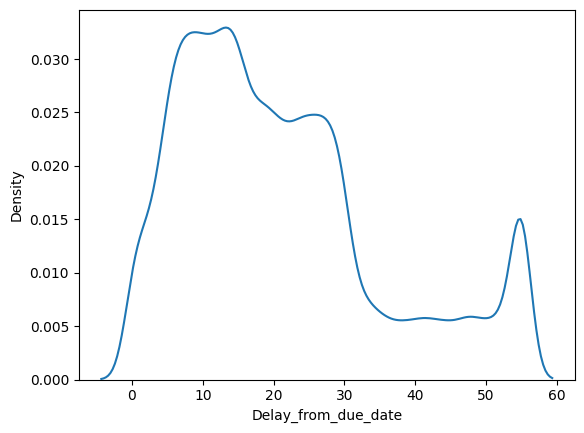

In [105]:
sns.kdeplot(x = df['Delay_from_due_date'] , data =df)
plt.show()

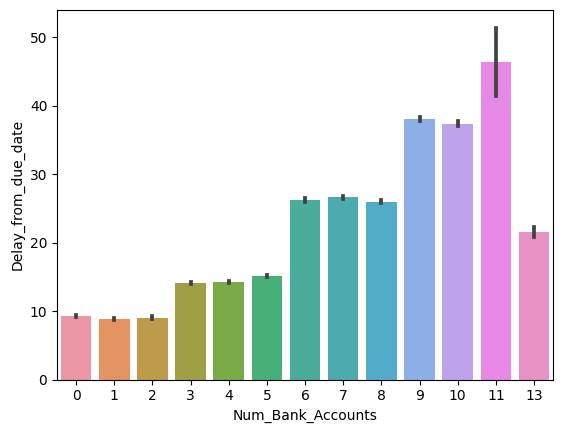

In [106]:
sns.barplot(x=df['Num_Bank_Accounts'] , y =df['Delay_from_due_date'] , data =df)
plt.show()

>- Here we notice that whoever has more accounts has Delay from due date

# 13- Num_of_Delayed_Payment

In [107]:
df['Num_of_Delayed_Payment'].unique()

array(['7', nan, '4', '8_', '6', '1', '-1', '3_', '0', '8', '5', '3', '9',
       '12', '15', '17', '10', '2', '2_', '11', '14', '20', '22', '13',
       '13_', '14_', '16', '12_', '18', '19', '23', '24', '21', '3318',
       '3083', '22_', '1338', '4_', '26', '11_', '3104', '21_', '25',
       '10_', '183_', '9_', '1106', '834', '19_', '24_', '17_', '23_',
       '2672', '20_', '2008', '-3', '538', '6_', '1_', '16_', '27', '-2',
       '3478', '2420', '15_', '707', '708', '26_', '18_', '3815', '28',
       '5_', '1867', '2250', '1463', '25_', '7_', '4126', '2882', '1941',
       '2655', '2628', '132', '3069', '306', '0_', '3539', '3684', '1823',
       '4128', '1946', '827', '2297', '2566', '904', '182', '929', '3568',
       '2503', '1552', '2812', '1697', '3764', '851', '3905', '923', '88',
       '1668', '3253', '808', '2689', '3858', '642', '3457', '1402',
       '1732', '3154', '847', '3037', '2204', '3103', '1063', '2056',
       '1282', '1841', '2569_', '211', '793', '3484', '4

In [108]:
df['Num_of_Delayed_Payment']=df['Num_of_Delayed_Payment'].str.replace('_','')
df['Num_of_Delayed_Payment']=df['Num_of_Delayed_Payment'].str.replace('-','')
df['Num_of_Delayed_Payment']=df['Num_of_Delayed_Payment'].astype(float)


In [109]:
df['Num_of_Delayed_Payment'].isna().sum()

7002

In [110]:
mean=df['Num_of_Delayed_Payment'].mean()
df['Num_of_Delayed_Payment'].fillna(mean , inplace =True)

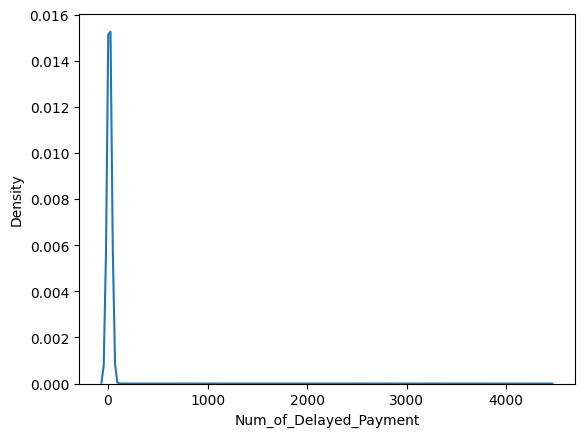

In [111]:
sns.kdeplot(x= df['Num_of_Delayed_Payment'] , data =df)
plt.show()

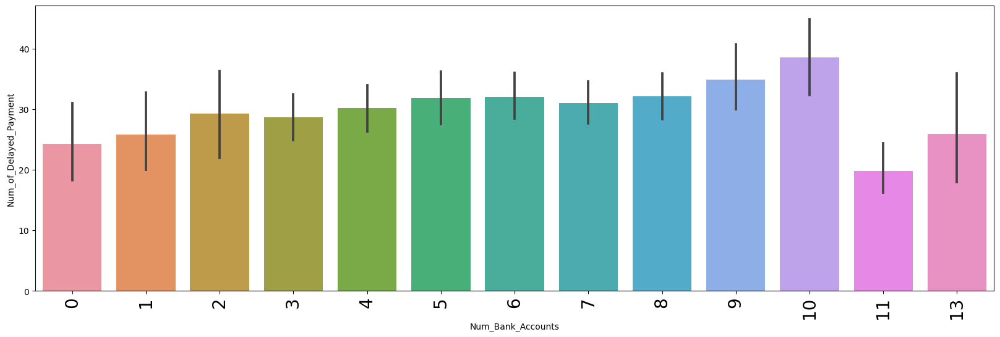

In [112]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Num_Bank_Accounts'] , y =df['Num_of_Delayed_Payment'] , data =df)
plt.xticks(fontsize= 20 , rotation= 'vertical')
plt.show()

In [113]:
df['Num_of_Delayed_Payment'].describe()

count    100000.000000
mean         30.946268
std         217.971811
min           0.000000
25%           9.000000
50%          15.000000
75%          19.000000
max        4397.000000
Name: Num_of_Delayed_Payment, dtype: float64

In [114]:
check_outliers('Num_of_Delayed_Payment',df)

[3318.0,
 3083.0,
 1338.0,
 3104.0,
 183.0,
 1106.0,
 834.0,
 2672.0,
 2008.0,
 538.0,
 3478.0,
 2420.0,
 707.0,
 708.0,
 3815.0,
 1867.0,
 2250.0,
 1463.0,
 4126.0,
 2882.0,
 1941.0,
 2655.0,
 2628.0,
 132.0,
 3069.0,
 306.0,
 3539.0,
 3684.0,
 1823.0,
 4128.0,
 1946.0,
 827.0,
 2297.0,
 2566.0,
 904.0,
 182.0,
 929.0,
 3568.0,
 2503.0,
 1552.0,
 2812.0,
 1697.0,
 3764.0,
 851.0,
 3905.0,
 923.0,
 88.0,
 1668.0,
 3253.0,
 808.0,
 2689.0,
 3858.0,
 642.0,
 3457.0,
 1402.0,
 1732.0,
 3154.0,
 847.0,
 3037.0,
 2204.0,
 3103.0,
 1063.0,
 2056.0,
 1282.0,
 1841.0,
 2569.0,
 211.0,
 793.0,
 3484.0,
 411.0,
 3491.0,
 2072.0,
 3050.0,
 1049.0,
 2162.0,
 3402.0,
 2753.0,
 1718.0,
 1014.0,
 3260.0,
 1946.0,
 3855.0,
 84.0,
 2311.0,
 3251.0,
 1832.0,
 4069.0,
 3010.0,
 733.0,
 4241.0,
 166.0,
 2461.0,
 1749.0,
 3200.0,
 663.0,
 2185.0,
 4161.0,
 3009.0,
 359.0,
 2015.0,
 1523.0,
 594.0,
 1079.0,
 1199.0,
 186.0,
 1015.0,
 1989.0,
 281.0,
 559.0,
 2165.0,
 1509.0,
 3545.0,
 779.0,
 192.0,
 4311.0

In [115]:
handle_outliers('Num_of_Delayed_Payment',df)

In [116]:
check_outliers('Num_of_Delayed_Payment',df)

[]

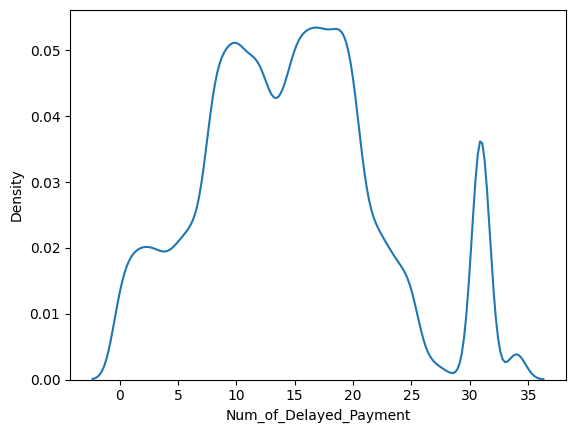

In [117]:
sns.kdeplot(x= df['Num_of_Delayed_Payment'] , data =df)
plt.show()

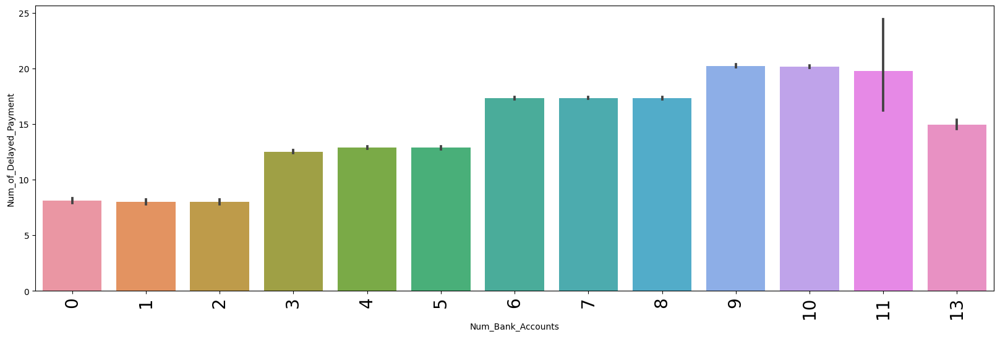

In [118]:
plt.figure(figsize=(20,6))
sns.barplot(x=df['Num_Bank_Accounts'] , y =df['Num_of_Delayed_Payment'] , data =df)
plt.xticks(fontsize= 20 , rotation= 'vertical')
plt.show()

In [119]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  int32  
 9   Type_of_Loan              100000 non-null  object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

# 14- Changed_Credit_Limit

In [120]:
df['Changed_Credit_Limit'].unique()

array(['11.27', '_', '6.27', ..., '17.509999999999998', '25.16', '21.17'],
      dtype=object)

In [121]:
df['Changed_Credit_Limit']=df['Changed_Credit_Limit'].str.replace('_','0')
df['Changed_Credit_Limit'] = df['Changed_Credit_Limit'].str.replace('-','')
df['Changed_Credit_Limit']=df['Changed_Credit_Limit'].astype(float)
df['Changed_Credit_Limit']= df['Changed_Credit_Limit'].replace('0',np.nan)
df['Changed_Credit_Limit']= df['Changed_Credit_Limit'].replace(np.nan , df['Changed_Credit_Limit'].mean())

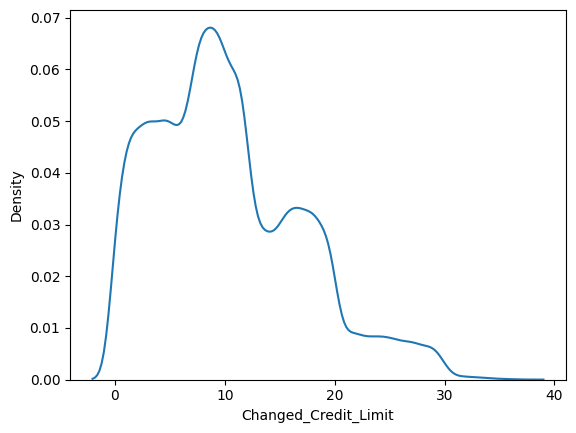

In [122]:
sns.kdeplot(x =df['Changed_Credit_Limit'] , data= df)
plt.show()

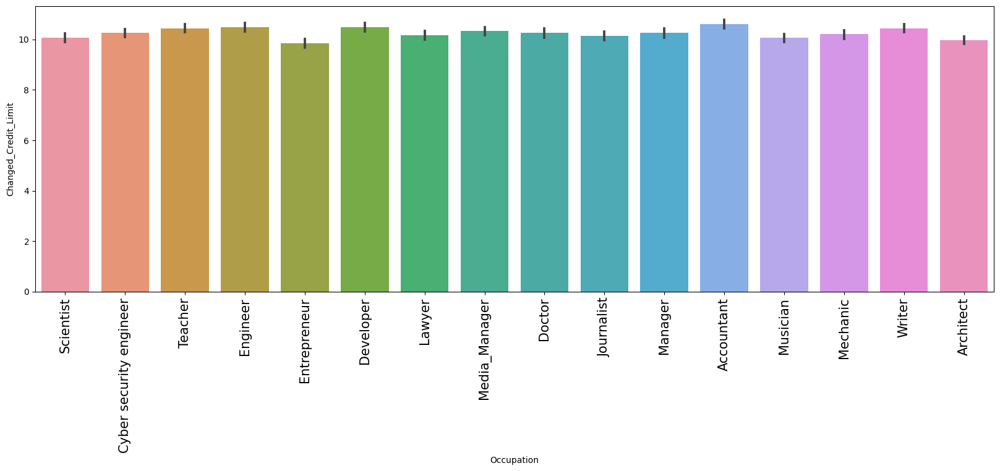

In [123]:
plt.figure(figsize=(20,6))
sns.barplot(x= df['Occupation'] , y= df['Changed_Credit_Limit'] , data =df )
plt.xticks(fontsize =15 , rotation ='vertical')
plt.show()

In [124]:
df['Changed_Credit_Limit'].describe()

count    100000.000000
mean         10.246841
std           6.768353
min           0.000000
25%           4.990000
50%           9.250000
75%          14.660000
max          36.970000
Name: Changed_Credit_Limit, dtype: float64

In [125]:
check_outliers('Changed_Credit_Limit' , df)

[29.52,
 29.52,
 31.52,
 29.52,
 29.52,
 29.52,
 29.52,
 29.52,
 29.21,
 32.64,
 33.43,
 34.02,
 35.82,
 29.82,
 29.82,
 29.82,
 29.82,
 29.82,
 29.82,
 29.18,
 31.33,
 29.33,
 34.81,
 29.94,
 32.18,
 29.19,
 29.19,
 29.19,
 29.19,
 29.19,
 29.19,
 30.47,
 30.47,
 31.07,
 29.9,
 31.46,
 35.83,
 30.45,
 33.19,
 29.97,
 29.97,
 29.97,
 29.97,
 29.97,
 30.91,
 33.02,
 32.47,
 34.91,
 32.980000000000004,
 34.47,
 32.09,
 32.09,
 31.09,
 33.61,
 31.71,
 30.32,
 29.77,
 31.77,
 29.77,
 29.77,
 34.77,
 29.77,
 29.77,
 29.77,
 32.620000000000005,
 30.62,
 29.41,
 30.06,
 29.94,
 35.4,
 33.4,
 30.25,
 32.84,
 29.84,
 29.84,
 29.84,
 29.84,
 29.84,
 29.84,
 29.22,
 34.120000000000005,
 30.12,
 29.49,
 29.64,
 29.64,
 29.64,
 32.64,
 29.64,
 29.64,
 29.64,
 29.64,
 29.45,
 29.45,
 29.45,
 29.45,
 29.45,
 29.45,
 31.45,
 29.81,
 31.82,
 31.79,
 31.79,
 31.61,
 29.66,
 32.66,
 29.5,
 30.12,
 30.85,
 33.239999999999995,
 32.0,
 32.45,
 32.4,
 33.260000000000005,
 29.26,
 29.26,
 31.26,
 31.03,
 29.9

In [126]:
handle_outliers('Changed_Credit_Limit', df)

In [127]:
check_outliers('Changed_Credit_Limit', df)

[]

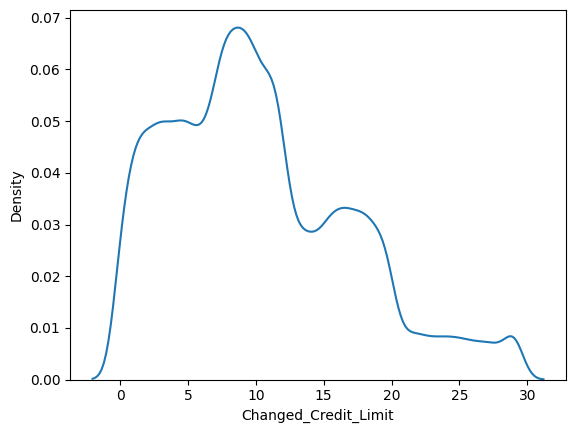

In [128]:
sns.kdeplot(x =df['Changed_Credit_Limit'] , data= df)
plt.show()

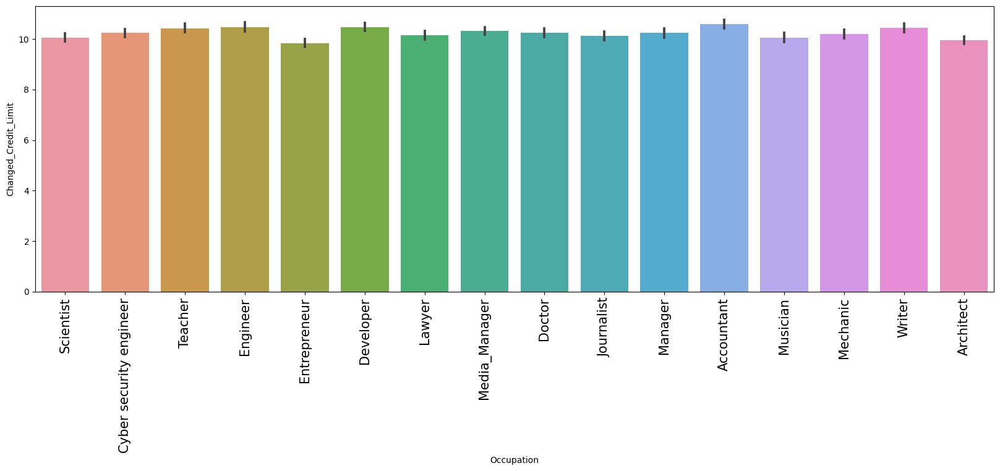

In [129]:
plt.figure(figsize=(20,6))
sns.barplot(x= df['Occupation'] , y= df['Changed_Credit_Limit'] , data =df )
plt.xticks(fontsize =15 , rotation ='vertical')
plt.show()

#  15-  Num_Credit_Inquiries

In [130]:
df['Num_Credit_Inquiries'].unique()

array([   4.,    2.,    3., ..., 1361.,  310.,   74.])

In [131]:
df['Num_Credit_Inquiries'].isna().sum()

1965

In [132]:
medain= df['Num_Credit_Inquiries'].median()
df['Num_Credit_Inquiries'].fillna(medain , inplace =True)

In [133]:
df['Num_Credit_Inquiries'].isna().sum()

0

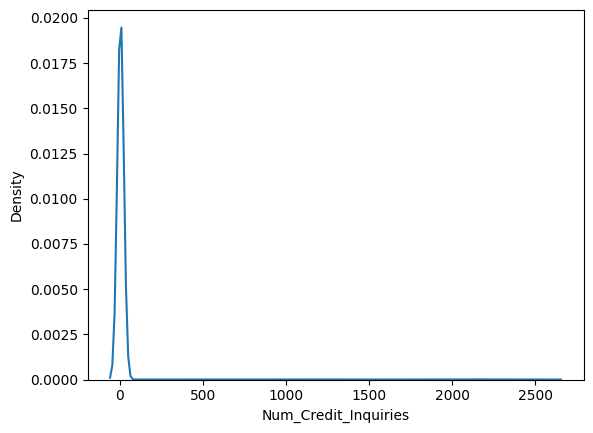

In [134]:
sns.kdeplot(x =df['Num_Credit_Inquiries'] , data = df)
plt.show()

In [135]:
df['Num_Credit_Inquiries'].describe()

count    100000.000000
mean         27.326780
std         191.293766
min           0.000000
25%           3.000000
50%           6.000000
75%           9.000000
max        2597.000000
Name: Num_Credit_Inquiries, dtype: float64

In [136]:
check_outliers('Num_Credit_Inquiries' , df)

[1050.0,
 1044.0,
 1936.0,
 568.0,
 1618.0,
 525.0,
 1251.0,
 76.0,
 285.0,
 119.0,
 651.0,
 1241.0,
 1839.0,
 1953.0,
 2321.0,
 1265.0,
 1265.0,
 2473.0,
 2271.0,
 1085.0,
 1194.0,
 2006.0,
 1952.0,
 1197.0,
 2238.0,
 996.0,
 1515.0,
 418.0,
 516.0,
 89.0,
 829.0,
 821.0,
 1760.0,
 46.0,
 1332.0,
 2539.0,
 1673.0,
 546.0,
 33.0,
 602.0,
 1122.0,
 2134.0,
 1151.0,
 955.0,
 103.0,
 168.0,
 1386.0,
 1985.0,
 794.0,
 2079.0,
 1189.0,
 977.0,
 2158.0,
 1279.0,
 460.0,
 1683.0,
 304.0,
 486.0,
 1351.0,
 86.0,
 1282.0,
 1347.0,
 2592.0,
 2161.0,
 471.0,
 1529.0,
 739.0,
 1615.0,
 1732.0,
 1251.0,
 2187.0,
 378.0,
 206.0,
 57.0,
 197.0,
 1864.0,
 1197.0,
 458.0,
 1340.0,
 61.0,
 1395.0,
 1119.0,
 1114.0,
 321.0,
 1992.0,
 2572.0,
 1479.0,
 205.0,
 876.0,
 1890.0,
 2081.0,
 946.0,
 1393.0,
 1672.0,
 1203.0,
 1247.0,
 1244.0,
 1015.0,
 574.0,
 1661.0,
 2138.0,
 361.0,
 364.0,
 1498.0,
 1562.0,
 2063.0,
 203.0,
 2297.0,
 34.0,
 2043.0,
 2128.0,
 1425.0,
 2310.0,
 2207.0,
 1194.0,
 824.0,
 536.0,

In [137]:
handle_outliers('Num_Credit_Inquiries' , df)

In [138]:
check_outliers('Num_Credit_Inquiries', df)

[]

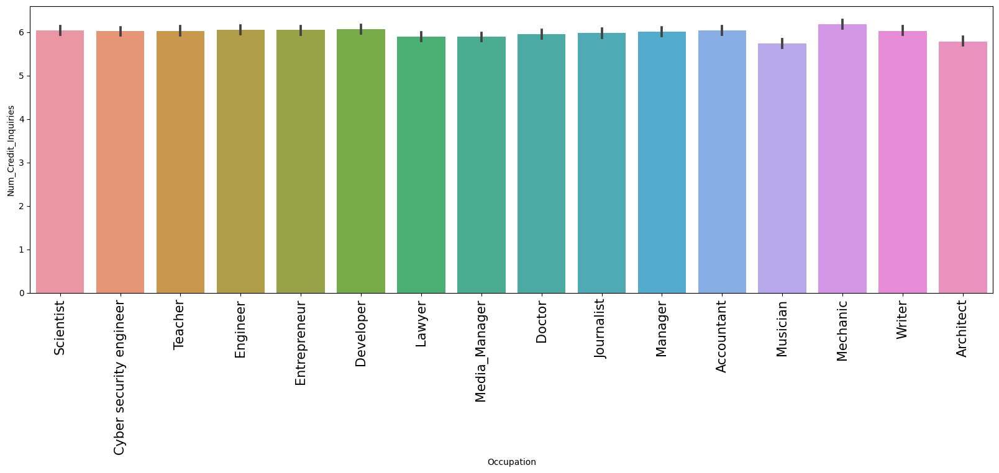

In [139]:
plt.figure(figsize = (20,6))
sns.barplot(x='Occupation',y='Num_Credit_Inquiries',data =df)
plt.xticks(fontsize =15 , rotation ='vertical')
plt.show()

# 16- Credit_Mix

In [140]:
df['Credit_Mix'].unique()

array(['_', 'Good', 'Standard', 'Bad'], dtype=object)

In [141]:
df['Credit_Mix'].value_counts()

Standard    36479
Good        24337
_           20195
Bad         18989
Name: Credit_Mix, dtype: int64

In [142]:
df['Credit_Mix'] =df['Credit_Mix'].str.replace('_', 'Standard')

In [143]:
df['Credit_Mix'].value_counts()

Standard    56674
Good        24337
Bad         18989
Name: Credit_Mix, dtype: int64

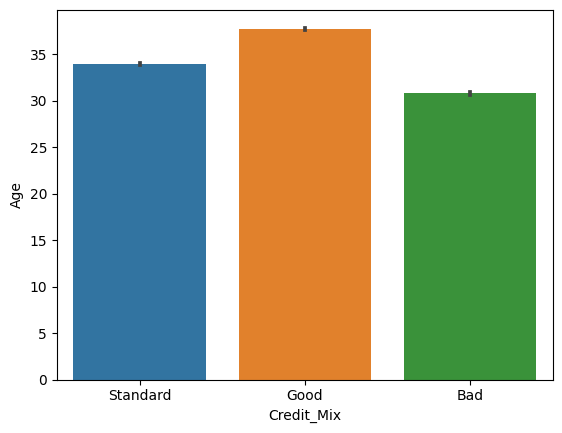

In [144]:
sns.barplot(x = df['Credit_Mix'] , y = df['Age'], data = df)
plt.show()

>- i will use the label encoder

In [145]:
df['Credit_Mix']=df['Credit_Mix'].map({'Bad':0 ,'Standard': 1 ,'Good':2 })

In [146]:
df.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,1,23.0,Scientist,19114.12,1824.843333,3,4.0,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.000000,11.27,4.0,1,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,2,23.0,Scientist,19114.12,4194.170850,3,4.0,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",0,30.946268,11.27,4.0,2,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,3,67.5,Scientist,19114.12,4194.170850,3,4.0,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3,7.000000,0.00,4.0,2,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,4,23.0,Scientist,19114.12,4194.170850,3,4.0,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5,4.000000,6.27,4.0,2,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,5,23.0,Scientist,19114.12,1824.843333,3,4.0,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6,30.946268,11.27,4.0,2,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  int32  
 9   Type_of_Loan              100000 non-null  object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  float64
 13  Num_Credit_Inquiries      100000 non-null  fl

# 17-Outstanding_Debt

In [148]:
df['Outstanding_Debt'].unique()

array(['809.98', '605.03', '1303.01', ..., '3571.7_', '3571.7', '502.38'],
      dtype=object)

In [149]:
df['Outstanding_Debt']= df['Outstanding_Debt'].str.replace('_', '')
df['Outstanding_Debt'] = df['Outstanding_Debt'] .str.replace('-', '')
df['Outstanding_Debt'] =df['Outstanding_Debt'] .astype(float)

In [150]:
df['Outstanding_Debt'].unique()

array([ 809.98,  605.03, 1303.01, ...,  620.64, 3571.7 ,  502.38])

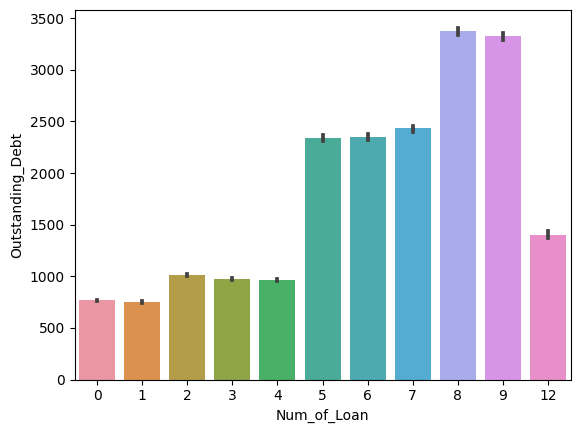

In [151]:
sns.barplot(x= df['Num_of_Loan'] , y =df['Outstanding_Debt'] , data =df)
plt.show()

In [152]:
df['Outstanding_Debt'].describe()

count    100000.000000
mean       1426.220376
std        1155.129026
min           0.230000
25%         566.072500
50%        1166.155000
75%        1945.962500
max        4998.070000
Name: Outstanding_Debt, dtype: float64

In [153]:
check_outliers('Outstanding_Debt' , df)

[4071.62,
 4071.62,
 4071.62,
 4071.62,
 4071.62,
 4071.62,
 4071.62,
 4071.62,
 4834.59,
 4834.59,
 4834.59,
 4834.59,
 4834.59,
 4834.59,
 4834.59,
 4834.59,
 4795.13,
 4795.13,
 4795.13,
 4795.13,
 4795.13,
 4795.13,
 4795.13,
 4795.13,
 4984.82,
 4984.82,
 4984.82,
 4984.82,
 4984.82,
 4984.82,
 4984.82,
 4984.82,
 4845.24,
 4845.24,
 4845.24,
 4845.24,
 4845.24,
 4845.24,
 4845.24,
 4845.24,
 4428.64,
 4428.64,
 4428.64,
 4428.64,
 4428.64,
 4428.64,
 4428.64,
 4428.64,
 4167.43,
 4167.43,
 4167.43,
 4167.43,
 4167.43,
 4167.43,
 4167.43,
 4167.43,
 4445.32,
 4445.32,
 4445.32,
 4445.32,
 4445.32,
 4445.32,
 4445.32,
 4445.32,
 4404.48,
 4404.48,
 4404.48,
 4404.48,
 4404.48,
 4404.48,
 4404.48,
 4404.48,
 4525.08,
 4525.08,
 4525.08,
 4525.08,
 4525.08,
 4525.08,
 4525.08,
 4525.08,
 4288.63,
 4288.63,
 4288.63,
 4288.63,
 4288.63,
 4288.63,
 4288.63,
 4288.63,
 4685.34,
 4685.34,
 4685.34,
 4685.34,
 4685.34,
 4685.34,
 4685.34,
 4685.34,
 4736.25,
 4736.25,
 4736.25,
 4736.25,


In [154]:
handle_outliers('Outstanding_Debt', df)

In [155]:
check_outliers('Outstanding_Debt' , df)

[]

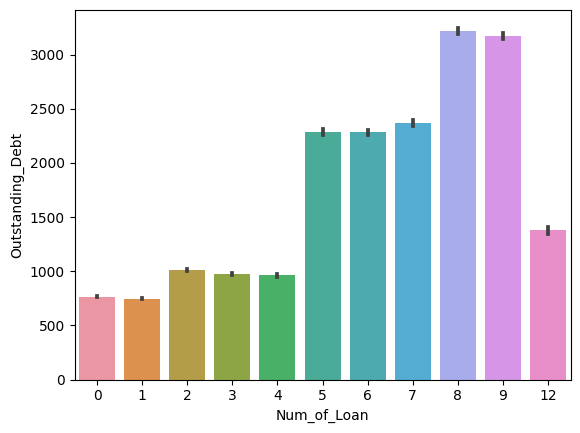

In [156]:
sns.barplot(x= df['Num_of_Loan'] , y =df['Outstanding_Debt'] , data =df)
plt.show()

# 18- Credit_Utilization_Ratio

In [157]:
df['Credit_Utilization_Ratio'].unique()

array([26.82261962, 31.94496006, 28.60935202, ..., 41.25552226,
       33.63820798, 34.19246265])

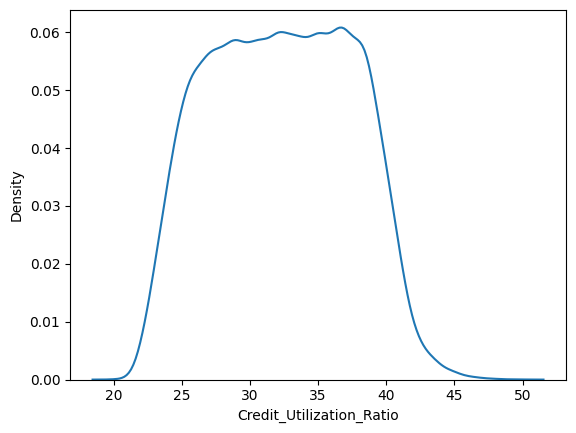

In [158]:
sns.kdeplot(x= df['Credit_Utilization_Ratio'] , data = df)
plt.show()

In [159]:
check_outliers('Credit_Utilization_Ratio', df)

[50.00000000000001, 49.52232429787243, 49.25498297529708, 49.56451934738699]

In [160]:
handle_outliers('Credit_Utilization_Ratio', df)

In [161]:
check_outliers('Credit_Utilization_Ratio' , df)

[]

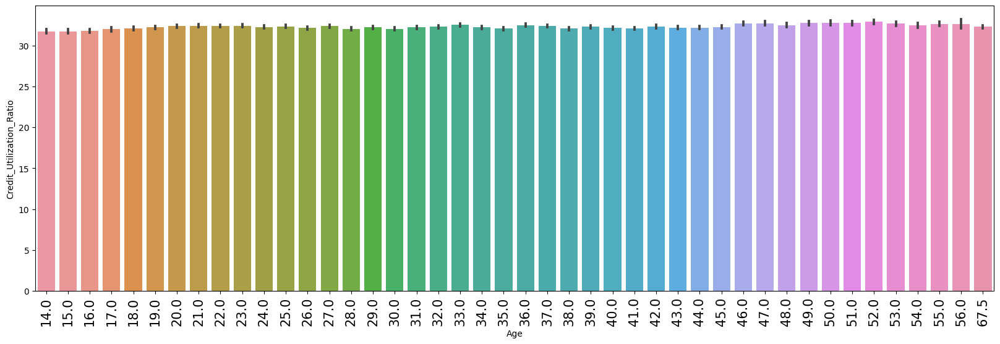

In [162]:
plt.figure(figsize = (20,6))
plt.xticks(fontsize =15 ,rotation = 'vertical' )
sns.barplot(x = df['Age'] , y = df['Credit_Utilization_Ratio'] , data =df)
plt.show()

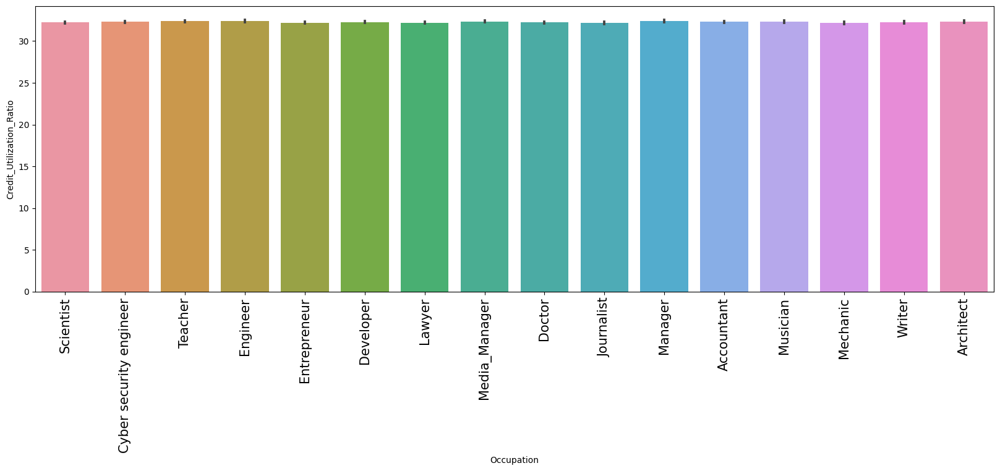

In [163]:
plt.figure(figsize = (20,6))
plt.xticks(fontsize =15 ,rotation = 'vertical' )
sns.barplot(x='Occupation',y='Credit_Utilization_Ratio',data =df)
plt.show()

# 19- Credit_History_Age

In [164]:
df['Credit_History_Age'].unique()

array(['22 Years and 1 Months', nan, '22 Years and 3 Months',
       '22 Years and 4 Months', '22 Years and 5 Months',
       '22 Years and 6 Months', '22 Years and 7 Months',
       '26 Years and 7 Months', '26 Years and 8 Months',
       '26 Years and 9 Months', '26 Years and 10 Months',
       '26 Years and 11 Months', '27 Years and 0 Months',
       '27 Years and 1 Months', '27 Years and 2 Months',
       '17 Years and 9 Months', '17 Years and 10 Months',
       '17 Years and 11 Months', '18 Years and 1 Months',
       '18 Years and 2 Months', '18 Years and 3 Months',
       '18 Years and 4 Months', '17 Years and 3 Months',
       '17 Years and 4 Months', '17 Years and 5 Months',
       '17 Years and 6 Months', '17 Years and 7 Months',
       '17 Years and 8 Months', '30 Years and 8 Months',
       '30 Years and 9 Months', '30 Years and 10 Months',
       '30 Years and 11 Months', '31 Years and 0 Months',
       '31 Years and 1 Months', '31 Years and 2 Months',
       '31 Years and

In [165]:
df['Credit_History_Age'].isna(). sum()

9030

In [166]:
mode = df['Credit_History_Age'].mode()[0]
df['Credit_History_Age'].fillna(mode , inplace =True)

In [167]:
df['Credit_History_Age'].isna(). sum()

0

In [168]:
df['Credit_History_Age'].value_counts()

15 Years and 11 Months    9476
19 Years and 4 Months      445
19 Years and 5 Months      444
17 Years and 11 Months     443
19 Years and 3 Months      441
                          ... 
0 Years and 3 Months        20
0 Years and 2 Months        15
33 Years and 7 Months       14
33 Years and 8 Months       12
0 Years and 1 Months         2
Name: Credit_History_Age, Length: 404, dtype: int64

In [169]:
df['Credit_History_year'],df['Credit_History_month'] =df['Credit_History_Age'].str.split('and' ,2).str

In [170]:
df.drop('Credit_History_Age' , axis =1 ,inplace =True)

In [171]:
df['Credit_History_year'] = df['Credit_History_year'].str.replace('Years','')
df['Credit_History_month'] = df['Credit_History_month'].str.replace('Months','')

In [172]:
df['Credit_History_year'] = df['Credit_History_year'].astype(int)
df['Credit_History_month'] = df['Credit_History_month'].astype(int)

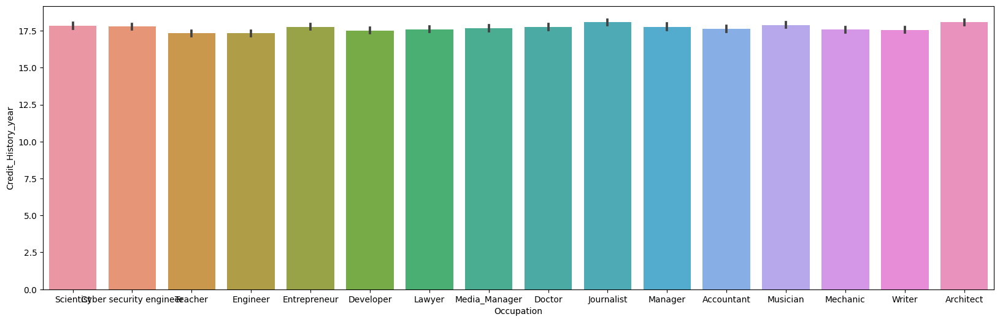

In [173]:
plt.figure(figsize = (20,6))
sns.barplot(x='Occupation',y='Credit_History_year',data =df)
plt.show()

# 20- Payment_of_Min_Amount

In [174]:
df['Payment_of_Min_Amount'].unique()

array(['No', 'NM', 'Yes'], dtype=object)

In [175]:
df['Payment_of_Min_Amount'].value_counts()

Yes    52326
No     35667
NM     12007
Name: Payment_of_Min_Amount, dtype: int64

>- i will use the label encoder

In [176]:
df['Payment_of_Min_Amount']= df['Payment_of_Min_Amount'].map({'Yes':0 , 'No':1 , 'NM': 2})

# 21- Total_EMI_per_month

In [177]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  int32  
 9   Type_of_Loan              100000 non-null  object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  float64
 13  Num_Credit_Inquiries      100000 non-null  fl

In [178]:
df['Total_EMI_per_month'].unique()

array([4.95749492e+01, 1.88162146e+01, 2.46992319e+02, ...,
       1.21120000e+04, 3.51040226e+01, 5.86380000e+04])

In [179]:
df['Total_EMI_per_month'].isna().sum()

0

<AxesSubplot: xlabel='Total_EMI_per_month', ylabel='Density'>

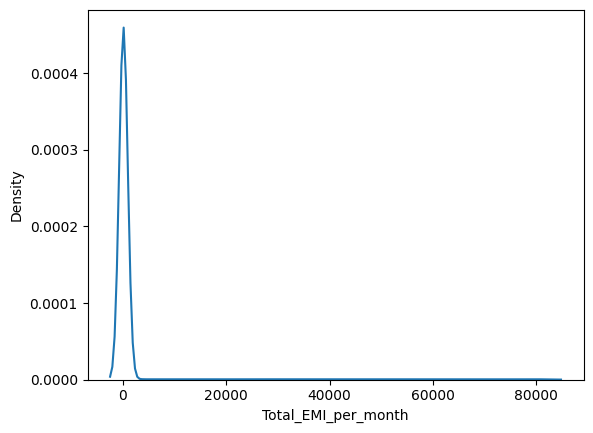

In [180]:
sns.kdeplot(x= df['Total_EMI_per_month'] , data = df)

In [181]:
check_outliers('Total_EMI_per_month' , df)

[15015.0,
 15515.0,
 911.2201793459374,
 23834.0,
 32662.0,
 911.2201793459374,
 911.2201793459374,
 911.2201793459374,
 16415.0,
 80357.0,
 629.8156531464217,
 629.8156531464217,
 629.8156531464217,
 629.8156531464217,
 629.8156531464217,
 56566.0,
 33746.0,
 14130.0,
 5994.0,
 31551.0,
 62073.0,
 37602.0,
 14982.0,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 364.9151774048712,
 81050.0,
 10292.0,
 19734.0,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 574.0657978713467,
 81441.0,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 485.75043098703753,
 50812.0,
 39347.0,
 3864.0,
 64504.0,
 1293.5054487288114,
 1293.5054487288114,
 1293.5054487288114,
 57516.0,
 57523.0,
 35788.0,
 35022.0,
 44834.0,
 

In [182]:
handle_outliers('Total_EMI_per_month', df)

In [183]:
check_outliers('Total_EMI_per_month' , df)

[]

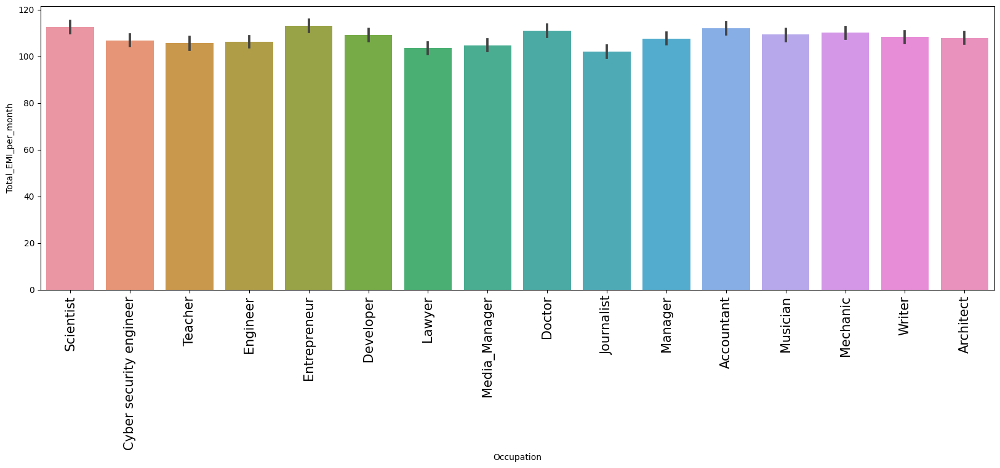

In [184]:
plt.figure(figsize=(20,6))
sns.barplot(x = df['Occupation'] , y= df['Total_EMI_per_month'] , data = df)
plt.xticks(fontsize =15 ,rotation ='vertical')
plt.show()

# 21- Amount_invested_monthly

In [185]:
df['Amount_invested_monthly'].unique()

array(['80.41529543900253', '118.28022162236736', '81.699521264648', ...,
       '24.02847744864441', '251.67258219721603', '167.1638651610451'],
      dtype=object)

In [186]:
df['Amount_invested_monthly'].isna().sum()

4479

In [187]:
df['Amount_invested_monthly'].value_counts()

__10000__             4305
0.0                    169
80.41529543900253        1
36.66235139442514        1
89.7384893604547         1
                      ... 
36.541908593249026       1
93.45116318631192        1
140.80972223052834       1
38.73937670100975        1
167.1638651610451        1
Name: Amount_invested_monthly, Length: 91049, dtype: int64

In [188]:
df['Amount_invested_monthly']= df['Amount_invested_monthly'].str.replace('__','')
df['Amount_invested_monthly'] = df['Amount_invested_monthly'].astype(float)

In [189]:
median = df['Amount_invested_monthly'].median()
df['Amount_invested_monthly'].fillna(medain , inplace =True)

In [190]:
df['Amount_invested_monthly'].isna().sum()

0

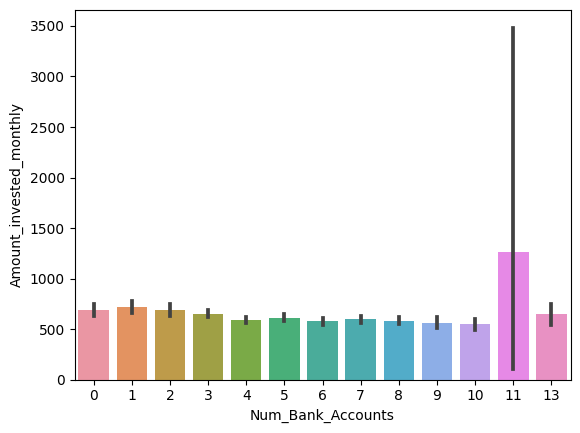

In [191]:
sns.barplot(x= df['Num_Bank_Accounts'] , y = df['Amount_invested_monthly'] , data= df)
plt.show()

In [192]:
check_outliers('Amount_invested_monthly' , df)

[10000.0,
 825.2162699393922,
 10000.0,
 10000.0,
 618.2023912505837,
 698.8732707169384,
 930.3918977796665,
 870.52238171816,
 649.8093641841638,
 546.3805705230692,
 686.1262165951837,
 635.1465605054178,
 10000.0,
 710.4953806729873,
 10000.0,
 743.540801271909,
 10000.0,
 807.2067768357648,
 644.2873937406405,
 626.869242023209,
 10000.0,
 10000.0,
 10000.0,
 565.7433852667033,
 542.0422096462502,
 770.6964130785489,
 10000.0,
 599.4618328116311,
 861.1156691643064,
 10000.0,
 10000.0,
 799.3743610756787,
 623.4087218945351,
 761.0455290669844,
 777.6020727296635,
 552.1106827759281,
 10000.0,
 874.7145584645815,
 589.8279399082364,
 549.0992910745523,
 545.6759426739467,
 10000.0,
 545.8997341448642,
 10000.0,
 670.5779060877218,
 614.4651135333024,
 10000.0,
 628.7091521225693,
 10000.0,
 10000.0,
 10000.0,
 573.4115904774258,
 10000.0,
 893.3631575106706,
 10000.0,
 701.6599477029933,
 10000.0,
 717.8975298624595,
 10000.0,
 1043.8736115710117,
 1038.7009403582074,
 10000.0,
 8

In [193]:
handle_outliers('Amount_invested_monthly' , df)

In [194]:
check_outliers('Amount_invested_monthly' , df)

[]

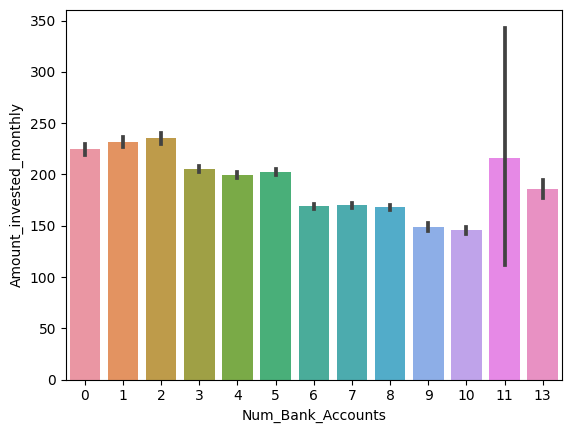

In [195]:
sns.barplot(x= df['Num_Bank_Accounts'] , y = df['Amount_invested_monthly'] , data= df)
plt.show()

# 22- Payment_Behaviour

In [196]:
df['Payment_Behaviour'].unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments', '!@9#%8',
       'High_spent_Large_value_payments'], dtype=object)

In [197]:
df['Payment_Behaviour'].isna().sum()

0

In [198]:
df['Payment_Behaviour'] = df['Payment_Behaviour'].str.replace('!@9#%8','Low_spent_Small_value_payments')

In [199]:
df['Payment_Behaviour'].unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'High_spent_Large_value_payments'], dtype=object)

In [200]:
df['Payment_Behaviour'] = df['Payment_Behaviour'].map({'High_spent_Small_value_payments':0 ,
                                                       'Low_spent_Large_value_payments':1 , 
                                                       'Low_spent_Medium_value_payments':2 ,
                                                       'Low_spent_Small_value_payments':3 ,
                                                       'High_spent_Medium_value_payments' :4 ,
                                                       'High_spent_Large_value_payments' : 5})
df['Payment_Behaviour'] =df['Payment_Behaviour'].astype(int)

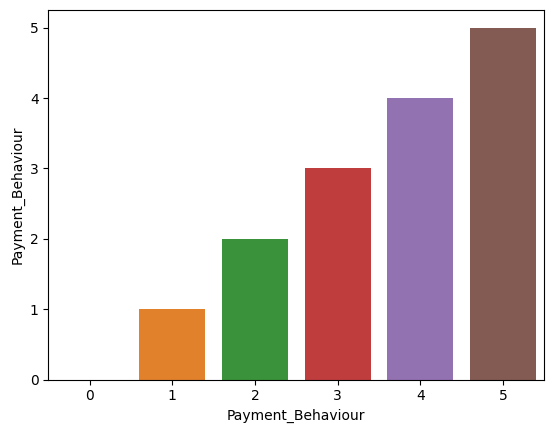

In [201]:
sns.barplot( x=df['Payment_Behaviour'] , y =df['Payment_Behaviour'] , data = df )
plt.show()

In [202]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  int64  
 1   Age                       100000 non-null  float64
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  float64
 4   Monthly_Inhand_Salary     100000 non-null  float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  float64
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  int32  
 9   Type_of_Loan              100000 non-null  object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    100000 non-null  float64
 12  Changed_Credit_Limit      100000 non-null  float64
 13  Num_Credit_Inquiries      100000 non-null  fl

# 23- Monthly_Balance

In [203]:
df['Monthly_Balance'].unique()

array(['312.49408867943663', '284.62916249607184', '331.2098628537912',
       ..., 516.8090832742814, 319.1649785257098, 393.6736955618808],
      dtype=object)

In [204]:
df['Monthly_Balance'].value_counts()

__-333333333333333333333333333__    9
312.49408867943663                  1
415.32532309844316                  1
252.08489793906085                  1
254.9709216273975                   1
                                   ..
366.2890379762706                   1
151.1882696261166                   1
306.75027851710234                  1
278.8720257394474                   1
393.6736955618808                   1
Name: Monthly_Balance, Length: 98792, dtype: int64

In [205]:
df['Monthly_Balance']= df['Monthly_Balance'] .str.replace('__', '')
df['Monthly_Balance']= df['Monthly_Balance'].astype(float)

In [206]:
df['Monthly_Balance'].isna().sum()

2868

In [207]:
median = df['Monthly_Balance'] .median()
df['Monthly_Balance'].fillna(median , inplace =True)

In [208]:
df['Monthly_Balance'].isna() .sum()

0

In [209]:
df['Monthly_Balance'].describe()

count    1.000000e+05
mean    -3.000000e+22
std      3.162151e+24
min     -3.333333e+26
25%      2.718048e+02
50%      3.364493e+02
75%      4.635022e+02
max      1.602041e+03
Name: Monthly_Balance, dtype: float64

In [210]:
check_outliers('Monthly_Balance' , df)

[1043.3159778669492,
 998.8692967863226,
 810.7821526659284,
 963.9215811205684,
 968.5555173846187,
 895.494583180492,
 796.2349097481042,
 858.462474411158,
 1038.5694068321734,
 899.1987716145285,
 963.2548189998564,
 1140.0673399198365,
 802.3004421328528,
 785.2583558699787,
 772.411908624267,
 792.0256603398883,
 854.5248768604907,
 823.7133773417005,
 878.2514462337779,
 920.4396545057373,
 782.5739727857823,
 939.8734297713614,
 761.0743967007086,
 755.2081802943327,
 881.6642742251445,
 970.3192716601593,
 939.6245613800266,
 947.6102963746632,
 768.9823963390119,
 955.3099214674013,
 791.733614589316,
 913.0316546874346,
 936.3073773982209,
 792.5790252202852,
 822.1939946638072,
 880.4274416639964,
 853.5473978404586,
 785.5315566758761,
 799.437983215134,
 795.554663772378,
 886.9776435574988,
 840.0253760517992,
 887.7276173808908,
 879.7520667701468,
 760.3649552023904,
 776.3343613074152,
 884.9056902902464,
 940.3944827695151,
 1157.8575217994078,
 789.4419359341587,
 1

In [211]:
handle_outliers('Monthly_Balance' , df)

In [212]:
check_outliers('Monthly_Balance' , df)

[]

# Credit_Score (target)

In [213]:
df = pd.get_dummies(df,columns=['Occupation'],drop_first=True)
df = pd.get_dummies(df , columns= ['Type_of_Loan'] , drop_first =True )

In [214]:
df.head()

,Month,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score,Credit_History_year,Credit_History_month,Occupation_Architect,Occupation_Cyber security engineer,Occupation_Developer,Occupation_Doctor,Occupation_Engineer,Occupation_Entrepreneur,Occupation_Journalist,Occupation_Lawyer,Occupation_Manager,Occupation_Mechanic,Occupation_Media_Manager,Occupation_Musician,Occupation_Scientist,Occupation_Teacher,Occupation_Writer,Type_of_Loan_Auto Loan,"Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Auto Loan, Credit-Builder Loan, Credit-Builder Loan, Mortgage Loan, and Personal Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Auto Loan, Student Loan, and Student Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Credit-Builder Loan, Payday Loan, Not Specified, Payday Loan, Student Loan, and Debt Consolidation Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Not Specified, Debt Consolidation Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Not Specified, and Home Equity Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, Personal Loan, Student Loan, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, and Debt Consolidation Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, and Home Equity Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, and Personal Loan","Type_of_Loan_Auto Loan, Auto Loan, Auto Loan, and Student Loan","Type_of_Loan_Auto Loan, Auto Loan, Credit-Builder Loan, Not Specified, Not Specified, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Credit-Builder Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Credit-Builder Loan, and Debt Consolidation Loan","Type_of_Loan_Auto Loan, Auto Loan, Credit-Builder Loan, and Home Equity Loan","Type_of_Loan_Auto Loan, Auto Loan, Credit-Builder Loan, and Personal Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Auto Loan, Not Specified, Personal Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Credit-Builder Loan, and Mortgage Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Credit-Builder Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Debt Consolidation Loan, Debt Consolidation Loan, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Mortgage Loan, Credit-Builder Loan, and Auto Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Payday Loan, Credit-Builder Loan, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Payday Loan, and Personal Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, Personal Loan, Home Equity Loan, Student Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, and Credit-Builder Loan","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, and Not Specified","Type_of_Loan_Auto Loan, Auto Loan, Debt Consolidation Loan, and Student Loan","Type_of_Loan_Auto Loan, Auto Loan, Home Equity Loan, Credit-Builder Loan, Mortgage Loan, and Payday Loan","Type_of_Loan_Auto Loan, Auto Loan, Home Equity Loan, Home Equity Loan, Personal Loan, Payday Loan, and Personal Loan","Type_of_Loan_Auto Loan, Auto Loan, Home Equity Loan, Student Loan, Home Equity Loan, Auto Loan, Mortgage Loan, and Home Equity Loan","Type_of_Loan_Auto Loan, Auto Loan, Home Equity Loan, and Debt Consolidation Loan","Type_of_Loan_Auto Loan, Auto Loan, Home Equity Loan, and Student Loan","Type_of_Loan_Auto Loan, Auto Loan, Mortgage Loan, Not Spec

In [215]:
df['Credit_Score'].unique()

array(['Good', 'Standard', 'Poor'], dtype=object)

In [216]:
df['Credit_Score'].value_counts()

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

>- i will use a lable encoder

In [217]:
df['Credit_Score'] =df['Credit_Score'].map({ 'Poor' : 0 ,'Standard' :1 , 'Good' :2})

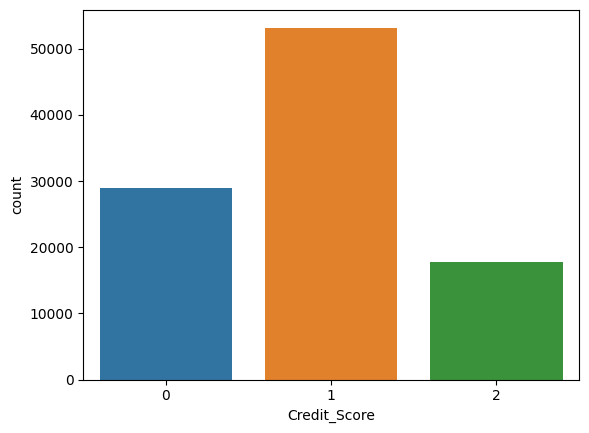

In [218]:
sns.countplot(x=df['Credit_Score'] , data =df )
plt.show()

# machine learning part

# Random Forest Classifier

In [219]:
# sns.pairplot(data=df)

In [220]:
X = df.drop('Credit_Score', axis =1).values
y = df['Credit_Score'].values

In [221]:
from sklearn.model_selection import train_test_split
X_train , X_test , y_train , y_test = train_test_split (X , y , random_state=32 , test_size=0.2)

In [222]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [223]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train,y_train)

RandomForestClassifier()

In [224]:
print('Train Score',model.score(X_train,y_train))
print('Test Score',model.score(X_test,y_test))

Train Score 1.0
Test Score 0.78655


In [225]:
y_pred = model.predict(X_test)
y_pred[:5]

array([1, 1, 0, 1, 1], dtype=int64)

In [226]:
y_test[:5]

array([1, 0, 0, 1, 1], dtype=int64)

# # Fix Imbalancing Data

In [227]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [228]:
from imblearn.combine import SMOTETomek
smt = SMOTETomek()
n_X_train,n_y_train = smt.fit_resample(X_train,y_train)

In [229]:
model = RandomForestClassifier()
model.fit(n_X_train,n_y_train)
y_pred = model.predict(X_test)

In [230]:
print('Train Score',model.score(X_train,y_train))
print('Test Score',model.score(X_test,y_test))

Train Score 0.978175
Test Score 0.76455


# decission tree classifier

In [231]:
X = df.drop('Credit_Score' , axis =1).values
y= df['Credit_Score'].values

In [232]:
from sklearn.model_selection import train_test_split
X_train , X_test , y_train , y_test = train_test_split(X,y, test_size=0.1 , random_state=32)

In [233]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [234]:
from sklearn.tree import DecisionTreeClassifier
decision_model_classifier = DecisionTreeClassifier(max_depth=5 , criterion='gini' )
decision_model_classifier.fit(X_train , y_train)

DecisionTreeClassifier(max_depth=5)

In [235]:
decision_model_classifier.score(X_train , y_train)

0.6966777777777777

In [236]:
decision_model_classifier.score(X_test , y_test)

0.6927

In [237]:
decision_model_classifier.feature_importances_

array([0.00753329, 0.        , 0.0005754 , ..., 0.        , 0.        ,
       0.        ])

In [238]:
y_pred= decision_model_classifier.predict(X_test)

In [243]:
# from sklearn.metrics import confusion_matrix
# CM = confusion_matrix(y_test , y_pred)
# CM

In [244]:
# sns.heatmap(CM , center=True)
# plt.show()